In [1]:
!pip install Twython
import pandas as pd
import numpy as np 
from twython import Twython
from twython import TwythonError
import requests
from bs4 import BeautifulSoup
from datetime import datetime
import ast
import time
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from collections import Counter
from nltk.corpus import stopwords
from nltk.util import ngrams
from sklearn.feature_extraction.text import CountVectorizer
plt.style.use('ggplot')

CONSUMER_KEY = "DyoTjohC4arsxLFBjmh71l5Fi"
CONSUMER_SECRET = "sWE3WV27dOOsZnRpSo19bZCojZykVqftYh1uAQvCwqviro4jT1"
OAUTH_TOKEN = "1133494860554604545-aQrvZDpNyxgi6MwQbHegX8Bkx6CUfI"
OAUTH_TOKEN_SECRET = "inqueIKTVIqqKGXKiHS7dOwNvSmCQdWgYN83ih1kQkNkS"
twitter = Twython(
    CONSUMER_KEY, CONSUMER_SECRET,
    OAUTH_TOKEN, OAUTH_TOKEN_SECRET)

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


# Rus Embassy Greece

https://twitter.com/RFEmbassyGr

In [2]:
Rus = []
try:
    user_timeline = twitter.get_user_timeline(screen_name='RFEmbassyGr',count=200, tweet_mode = 'extended'  )
except TwythonError as e:
    print("Error getting tweets:", e)
print("I Got:", len(user_timeline), " tweets")
for tweet in user_timeline:
    # Add whatever you want from the tweet, here we just add the text
    Rus.append(tweet)

I Got: 200  tweets


In [3]:
pd.DataFrame(Rus)

,created_at,id,id_str,full_text,truncated,display_text_range,entities,extended_entities,source,in_reply_to_status_id,...,retweeted,possibly_sensitive,lang,retweeted_status,withheld_scope,withheld_in_countries,quoted_status_id,quoted_status_id_str,quoted_status_permalink,quoted_status
0,Sun Jul 03 10:40:13 +0000 2022,1543545138877718532,1543545138877718532,🎨 Στις 2 Ιουλίου του 1839 γεννήθηκε ο #Ρώσος ζ...,False,"[0, 262]","{'hashtags': [{'text': 'Ρώσος', 'indices': [38...","{'media': [{'id': 1543545126101868544, 'id_str...","<a href=""http://twitter.com/download/iphone"" r...",NaN,...,False,False,el,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Sat Jul 02 21:22:52 +0000 2022,1543344478056026114,1543344478056026114,Στις 2 Ιουλίου πέθανε ο σκηνοθέτης και σχεδιασ...,False,"[0, 234]","{'hashtags': [{'text': 'Σβάρτσμαν', 'indices':...","{'media': [{'id': 1543344472817373185, 'id_str...","<a href=""http://twitter.com/download/iphone"" r...",NaN,...,False,False,el,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Sat Jul 02 13:41:44 +0000 2022,1543228429566345216,1543228429566345216,🎉 #Σανσήμερα το 1860 ιδρύθηκε η πόλη #Βλαδιβοσ...,False,"[0, 221]","{'hashtags': [{'text': 'Σανσήμερα', 'indices':...","{'media': [{'id': 1543228419386871810, 'id_str...","<a href=""http://twitter.com/download/iphone"" r...",NaN,...,False,False,el,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Sat Jul 02 12:16:23 +0000 2022,1543206954427875329,1543206954427875329,💬 Μαρία #Ζαχάροβα:\n\nΣτα απελευθερωμένα εδάφη...,False,"[0, 239]","{'hashtags': [{'text': 'Ζαχάροβα', 'indices': ...","{'media': [{'id': 1543206942411202562, 'id_str...","<a href=""http://twitter.com/download/iphone"" r...",NaN,...,False,False,el,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Fri Jul 01 18:56:39 +0000 2022,1542945295352438784,1542945295352438784,🎊 Σαν σήμερα το 1889 γεννήθηκε η εξάιρετη Σοβι...,False,"[0, 273]","{'hashtags': [{'text': 'Μούχινα', 'indices': [...","{'media': [{'id': 1542945282563899392, 'id_str...","<a href=""http://twitter.com/download/iphone"" r...",NaN,...,False,False,el,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,Thu Apr 28 09:46:13 +0000 2022,1519613949712416769,1519613949712416769,"RT @mfa_russia: ⭐️ On April 28, 1945, a milita...",False,"[0, 140]","{'hashtags': [{'text': 'OTD', 'indices': [90, ...",NaN,"<a href=""http://twitter.com/download/iphone"" r...",NaN,...,False,NaN,en,{'created_at': 'Thu Apr 28 06:43:58 +0000 2022...,NaN,NaN,NaN,NaN,NaN,NaN
196,Wed Apr 27 06:54:53 +0000 2022,1519208443877507073,1519208443877507073,RT @mfa_russia: 🇷🇺🇺🇳 President #Putin during t...,False,"[0, 140]","{'hashtags': [{'text': 'Putin', 'indices': [31...",NaN,"<a href=""http://twitter.com/download/android"" ...",NaN,...,False,NaN,en,{'created_at': 'Wed Apr 27 06:53:36 +0000 2022...,NaN,NaN,NaN,NaN,NaN,NaN
197,Tue Apr 26 12:39:15 +0000 2022,1518932720977649666,1518932720977649666,❗ Посольство проверяет появившуюся в СМИ инфор...,False,"[0, 209]","{'hashtags': [], 'symbols': [], 'user_mentions...","{'media': [{'id': 1518932718393962498, 'id_str...","<a href=""http://twitter.com/download/android"" ...",NaN,...,False,False,ru,NaN,NaN,NaN,NaN,NaN,NaN,NaN
198,Tue Apr 26 10:56:06 +0000 2022,1518906761792606212,1518906761792606212,"RT @mfa_russia: 🕯 On April 26, 1986, the Chern...",False,"[0, 140]","{'hashtags': [], 'symbols': [], 'user_mentions...",NaN,"<a href=""http://twitter.com/download/android"" ...",NaN,...,False,NaN,en,{'created_at': 'Tue Apr 26 09:15:01 +0000 2022...,NaN,NaN,NaN,NaN,NaN,NaN


In [4]:
# Count could be less than 200, see:
# https://dev.twitter.com/discussions/7513
while len(user_timeline) != 0: 
    try:
        user_timeline = twitter.get_user_timeline(screen_name='RFEmbassyGr',count=100,
                                                  tweet_mode = 'extended', max_id=user_timeline[len(user_timeline)-1]['id']-1)
    except TwythonError as e:
        print("Error getting tweets:", e)
    if len(user_timeline) > 0:
        print("I Got:", len(user_timeline), " tweets more... Last ID:", user_timeline[len(user_timeline)-1]['id']-1)
    for tweet in user_timeline:
        # Add whatever you want from the tweet, here we just add the text
        Rus.append(tweet)
# Number of tweets the user has made
print("I got :", len(Rus), " in total!!!")

I Got: 100  tweets more... Last ID: 1504701358800355339
I Got: 100  tweets more... Last ID: 1497980954375335942
I Got: 100  tweets more... Last ID: 1491458716709060608
I Got: 100  tweets more... Last ID: 1481212268180385793
I Got: 100  tweets more... Last ID: 1468298625407201279
I Got: 100  tweets more... Last ID: 1458806970387939331
I Got: 100  tweets more... Last ID: 1447893271804616709
I Got: 100  tweets more... Last ID: 1438452637729497090
I Got: 100  tweets more... Last ID: 1430062985712742403
I Got: 100  tweets more... Last ID: 1420617810896736255
I Got: 100  tweets more... Last ID: 1411389179028819968
I Got: 100  tweets more... Last ID: 1403668293953757186
I Got: 100  tweets more... Last ID: 1393456261316894720
I Got: 100  tweets more... Last ID: 1383334430157139973
I Got: 100  tweets more... Last ID: 1373250530261229568
I Got: 99  tweets more... Last ID: 1359968798321881088
I Got: 99  tweets more... Last ID: 1351439406520016896
I Got: 100  tweets more... Last ID: 13369230709011

In [5]:
# Number of tweets the user has made
print("I got :", len(Rus), " in total!!!")
#len(Rus)

I got : 3248  in total!!!


In [6]:
for tweet in Rus:
    print(tweet['created_at'],tweet['full_text'])

Η έξοδος ροής περικόπηκε στις τελευταίες 5000 γραμμές.
💬 Πριν 2 χρόνια οι Τούρκοι εταίροι συμφώνησαν μαζί μας ότι θα καταπολεμούν τρομοκράτες στη ζώνη του Ιντλίμπ και θα τους διαχωρίσουν από μη τρομοκρατικές ένοπλες ομάδες που συνεργάζονται με Τουρκικό στρατό. Είναι προφανές ότι αυτή η δέσμευση εφαρμόζεται αργά https://t.co/XbLiVjuyw6
Sun Sep 26 17:22:45 +0000 2021 🏰 Έχετε επισκεφθεί το Παλάτι του Αυτοκράτορα Παύλου κοντά στην Αγ.Πετρούπολη;
Διαθέτει την πανέμορφη Ελληνική Αίθουσα δεξιώσεων και χοροεσπεριδών, με περιστύλιο.
Δημιουργήθηκε το 1790 και αναδεικνύει το ρόλο του ελληνικού πολιτισμού στη Ρωσία.
🔗 https://t.co/Zv6ODbhuzw https://t.co/TmaTnVu9g4
Sun Sep 26 08:34:53 +0000 2021 🏎️ Σημερα στις 15:00 στο Ολυμπιακό Πάρκο του Σότσι θα γίνει ο αγώνας του Γκραν Πρι της Ρωσίας, 15ου γύρου του Παγκοσμίου Πρωταθλήματος 2021 της Φόρμουλα 1. Ένα συναρπαστικό θέαμα μας περιμένει!

🔗 https://t.co/SeraVAFz5X https://t.co/nIJt0dGu0n
Sat Sep 25 17:28:59 +0000 2021 🇷🇺🇬🇷В ходе Фестиваля «Россия – 

In [7]:
#Rus[0]

In [8]:
Rus_df = pd.DataFrame(Rus)
Rus_df

,created_at,id,id_str,full_text,truncated,display_text_range,entities,extended_entities,source,in_reply_to_status_id,...,retweeted,possibly_sensitive,lang,retweeted_status,withheld_scope,withheld_in_countries,quoted_status_id,quoted_status_id_str,quoted_status_permalink,quoted_status
0,Sun Jul 03 10:40:13 +0000 2022,1543545138877718532,1543545138877718532,🎨 Στις 2 Ιουλίου του 1839 γεννήθηκε ο #Ρώσος ζ...,False,"[0, 262]","{'hashtags': [{'text': 'Ρώσος', 'indices': [38...","{'media': [{'id': 1543545126101868544, 'id_str...","<a href=""http://twitter.com/download/iphone"" r...",NaN,...,False,False,el,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Sat Jul 02 21:22:52 +0000 2022,1543344478056026114,1543344478056026114,Στις 2 Ιουλίου πέθανε ο σκηνοθέτης και σχεδιασ...,False,"[0, 234]","{'hashtags': [{'text': 'Σβάρτσμαν', 'indices':...","{'media': [{'id': 1543344472817373185, 'id_str...","<a href=""http://twitter.com/download/iphone"" r...",NaN,...,False,False,el,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Sat Jul 02 13:41:44 +0000 2022,1543228429566345216,1543228429566345216,🎉 #Σανσήμερα το 1860 ιδρύθηκε η πόλη #Βλαδιβοσ...,False,"[0, 221]","{'hashtags': [{'text': 'Σανσήμερα', 'indices':...","{'media': [{'id': 1543228419386871810, 'id_str...","<a href=""http://twitter.com/download/iphone"" r...",NaN,...,False,False,el,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Sat Jul 02 12:16:23 +0000 2022,1543206954427875329,1543206954427875329,💬 Μαρία #Ζαχάροβα:\n\nΣτα απελευθερωμένα εδάφη...,False,"[0, 239]","{'hashtags': [{'text': 'Ζαχάροβα', 'indices': ...","{'media': [{'id': 1543206942411202562, 'id_str...","<a href=""http://twitter.com/download/iphone"" r...",NaN,...,False,False,el,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Fri Jul 01 18:56:39 +0000 2022,1542945295352438784,1542945295352438784,🎊 Σαν σήμερα το 1889 γεννήθηκε η εξάιρετη Σοβι...,False,"[0, 273]","{'hashtags': [{'text': 'Μούχινα', 'indices': [...","{'media': [{'id': 1542945282563899392, 'id_str...","<a href=""http://twitter.com/download/iphone"" r...",NaN,...,False,False,el,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3243,Mon Nov 11 10:03:38 +0000 2019,1193831641220833282,1193831641220833282,Российские дипломаты на финишной прямой Афинск...,False,"[0, 188]","{'hashtags': [], 'symbols': [], 'user_mentions...","{'media': [{'id': 1193831441030950914, 'id_str...","<a href=""http://twitter.com/download/android"" ...",NaN,...,False,False,und,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3244,Sun Nov 10 09:32:05 +0000 2019,1193461313860710416,1193461313860710416,Τώρα: Ο 37ς Αυθεντικός Μαραθώνιος - η γιορτή ζ...,False,"[0, 74]","{'hashtags': [{'text': 'Ελλάδα', 'indices': [6...","{'media': [{'id': 1193461222743707648, 'id_str...","<a href=""http://twitter.com/download/android"" ...",NaN,...,False,False,el,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3245,Sat Nov 09 17:34:39 +0000 2019,1193220369047576583,1193220369047576583,Βίντεο: Ο Πρόεδρος της Ρωσίας Βλ.Πούτιν απένει...,False,"[0, 190]","{'hashtags': [{'text': 'Ελλάδα', 'indices': [1...","{'media': [{'id': 1193220360088498176, 'id_str...","<a href=""http://twitter.com/download/android"" ...",NaN,...,False,False,el,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3246,Fri Nov 08 14:20:31 +0000 2019,1192809126881038336,1192809126881038336,Ο Υφυπουργός Εξωτερικών της Ρωσίας Αλεκσάντερ ...,False,"[0, 139]","{'hashtags': [{'text': 'Ελλάδα', 'indices': [1...",NaN,"<a href=""http://twitter.com/download/android"" ...",NaN,...,False,False,el,NaN,NaN,NaN,1.192746e+18,1192746085703397376,"{'url': 'https://t.co/44KfUEukay', 'expanded':...",{'created_at': 'Fri Nov 08 10:10:01 +0000 2019...


In [9]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [10]:
Rus_df.to_csv("/content/gdrive/My Drive/Colab Notebooks/Rus.tsv", sep='\t')

#Rus df

In [11]:
Rus = Rus_df[['created_at','full_text' ]]
Rus = Rus.rename(columns={'created_at': 'date', 'full_text': 'text'} )
Rus

,date,text
0,Sun Jul 03 10:40:13 +0000 2022,🎨 Στις 2 Ιουλίου του 1839 γεννήθηκε ο #Ρώσος ζ...
1,Sat Jul 02 21:22:52 +0000 2022,Στις 2 Ιουλίου πέθανε ο σκηνοθέτης και σχεδιασ...
2,Sat Jul 02 13:41:44 +0000 2022,🎉 #Σανσήμερα το 1860 ιδρύθηκε η πόλη #Βλαδιβοσ...
3,Sat Jul 02 12:16:23 +0000 2022,💬 Μαρία #Ζαχάροβα:\n\nΣτα απελευθερωμένα εδάφη...
4,Fri Jul 01 18:56:39 +0000 2022,🎊 Σαν σήμερα το 1889 γεννήθηκε η εξάιρετη Σοβι...
...,...,...
3243,Mon Nov 11 10:03:38 +0000 2019,Российские дипломаты на финишной прямой Афинск...
3244,Sun Nov 10 09:32:05 +0000 2019,Τώρα: Ο 37ς Αυθεντικός Μαραθώνιος - η γιορτή ζ...
3245,Sat Nov 09 17:34:39 +0000 2019,Βίντεο: Ο Πρόεδρος της Ρωσίας Βλ.Πούτιν απένει...
3246,Fri Nov 08 14:20:31 +0000 2019,Ο Υφυπουργός Εξωτερικών της Ρωσίας Αλεκσάντερ ...


In [12]:
#Rus.dtypes

In [13]:
Rus['year'] = pd.DatetimeIndex(Rus['date']).year
Rus['month'] = pd.DatetimeIndex(Rus['date']).month
Rus['day'] = pd.DatetimeIndex(Rus['date']).day
Rus

,date,text,year,month,day
0,Sun Jul 03 10:40:13 +0000 2022,🎨 Στις 2 Ιουλίου του 1839 γεννήθηκε ο #Ρώσος ζ...,2022,7,3
1,Sat Jul 02 21:22:52 +0000 2022,Στις 2 Ιουλίου πέθανε ο σκηνοθέτης και σχεδιασ...,2022,7,2
2,Sat Jul 02 13:41:44 +0000 2022,🎉 #Σανσήμερα το 1860 ιδρύθηκε η πόλη #Βλαδιβοσ...,2022,7,2
3,Sat Jul 02 12:16:23 +0000 2022,💬 Μαρία #Ζαχάροβα:\n\nΣτα απελευθερωμένα εδάφη...,2022,7,2
4,Fri Jul 01 18:56:39 +0000 2022,🎊 Σαν σήμερα το 1889 γεννήθηκε η εξάιρετη Σοβι...,2022,7,1
...,...,...,...,...,...
3243,Mon Nov 11 10:03:38 +0000 2019,Российские дипломаты на финишной прямой Афинск...,2019,11,11
3244,Sun Nov 10 09:32:05 +0000 2019,Τώρα: Ο 37ς Αυθεντικός Μαραθώνιος - η γιορτή ζ...,2019,11,10
3245,Sat Nov 09 17:34:39 +0000 2019,Βίντεο: Ο Πρόεδρος της Ρωσίας Βλ.Πούτιν απένει...,2019,11,9
3246,Fri Nov 08 14:20:31 +0000 2019,Ο Υφυπουργός Εξωτερικών της Ρωσίας Αλεκσάντερ ...,2019,11,8


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning: The default value of regex will change from True to False in a future version.
  """Entry point for launching an IPython kernel.


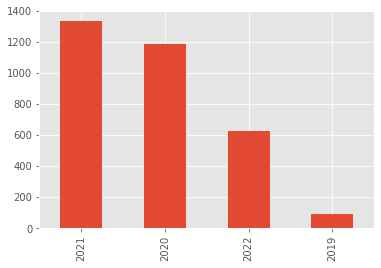

In [14]:
Rus['text'] = Rus['text'].str.replace(r'https?:\/\/.*[\r\n]*'," ")
Rus['year'].value_counts().plot(kind='bar')

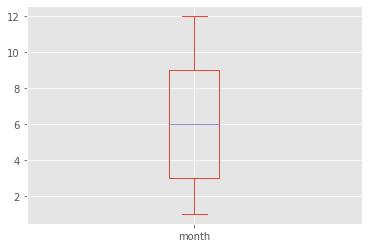

In [15]:
Rus['month'].plot(kind='box')

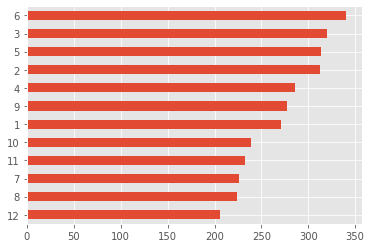

In [16]:
Rus['month'].value_counts().sort_values(ascending=True).plot(kind='barh')


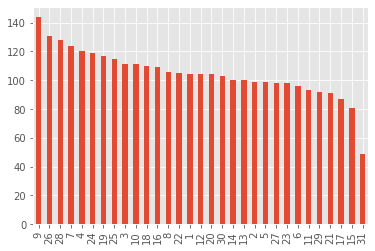

In [17]:
Rus['day'].value_counts().plot(kind='bar')

In [18]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt

In [19]:
Rus[Rus['year']==2022]['text']

0      🎨 Στις 2 Ιουλίου του 1839 γεννήθηκε ο #Ρώσος ζ...
1      Στις 2 Ιουλίου πέθανε ο σκηνοθέτης και σχεδιασ...
2      🎉 #Σανσήμερα το 1860 ιδρύθηκε η πόλη #Βλαδιβοσ...
3      💬 Μαρία #Ζαχάροβα:\n\nΣτα απελευθερωμένα εδάφη...
4      🎊 Σαν σήμερα το 1889 γεννήθηκε η εξάιρετη Σοβι...
                             ...                        
624    ✈️ Τον Δεκέμβριο 2021, το ρωσικό αεροσκάφος MC...
625    RT @mfa_russia: 🇷🇺 Russian President Vladimir ...
626    🎄Αναπολούμε λαμπρές στιγμές της απερχόμενης χρ...
627    #Lavrov: \n💬We are maintaining working contact...
628    🎄🌨️Καλή χρονιά σε όλους!\n\n🇷🇺#FromRussiaWithL...
Name: text, Length: 629, dtype: object

In [20]:
# Ισως καποτε χρειαστεί να αφαιρέσουμε τους τόνους.....
text = Rus['text'].str.replace('ά','α').str.replace("έ", "ε").str.replace('ή','η').str.replace('ί','ι').str.replace('ό','ο').str.replace('ύ','υ').str.replace('ώ','ω')

In [21]:
text = Rus[Rus['year']==2022]['text'].str.cat(sep = '.').replace("amp", ' ')
text

'🎨 Στις 2 Ιουλίου του 1839 γεννήθηκε ο #Ρώσος ζωγράφος, μέλος των «Περιπλανώμενων» Κωνσταντίν #Μακόφσκι. \n\nΑς θυμηθούμε τα θαυμάσια έργα του:\n\n1. Η αυτοπροσωπογραφία (1856)\n2. Η Χριστουγεννιάτικη μαντεία (1905)\n3. Ο γάμος των βογιάρων (1883)\n4. Η τυφλόμυγα (1891)  .Στις 2 Ιουλίου πέθανε ο σκηνοθέτης και σχεδιαστής κινουμένων σχεδίων Λεωνίντ #Σβάρτσμαν. Ανάμεσα στα πολλά έργα του είναι η εικόνα του μικρού αξιολάτρευτου ζώου #Τσεμπουράσκα, το οποίο τώρα είναι γνωστό και αγαπημένο σε όλο τον κόσμο.  .🎉 #Σανσήμερα το 1860 ιδρύθηκε η πόλη #Βλαδιβοστόκ («κυριαρχώ την Ανατολή» από τα ρωσικά), ο μεγαλύτερος λιμένας της Ρωσίας στον Ειρηνικό ωκεανό. \n\n🌉 Εδώ βρίσκεται η μεγαλύτερη σε μήκος ανοιγμάτων καλωδιωτή γέφυρα #Ρούσκι.  .💬 Μαρία #Ζαχάροβα:\n\nΣτα απελευθερωμένα εδάφη τακτοποιείται η ειρηνική ζωή, αποκαθίστανται η οικονομία και η βιομηχανία, ανοικοδομούνται οι υποδομές, αρχίζουν να εργάζονται οι επιχειρήσεις, ανοίγουν νηπιαγωγεία, πολυκλινικές και νοσοκομεία.  .🎊 Σαν σήμερα το 1889

In [22]:
list(STOPWORDS)[0:20]

['its',
 "she's",
 'a',
 "weren't",
 'him',
 'so',
 'an',
 'http',
 "couldn't",
 'they',
 'which',
 'out',
 "shouldn't",
 'myself',
 'could',
 "how's",
 'just',
 "i'd",
 'however',
 'was']

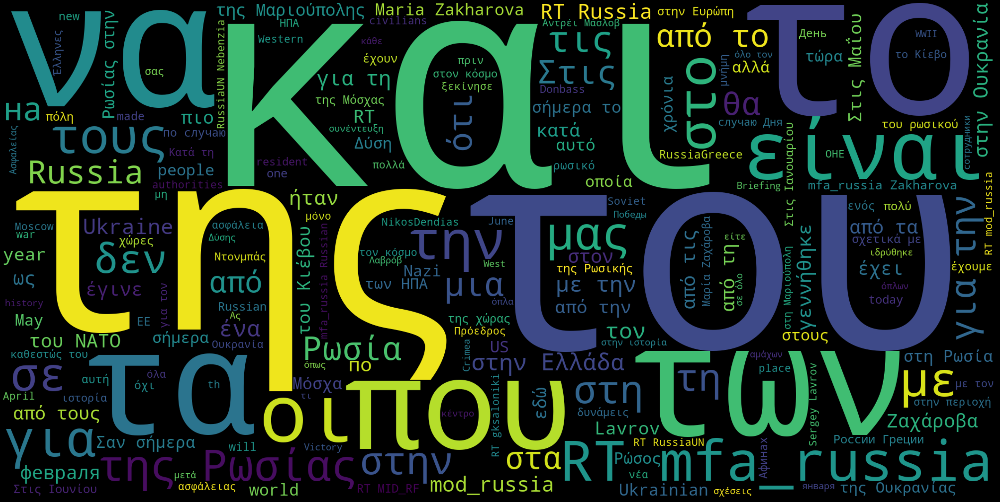

In [23]:
wordcloud = WordCloud(
#   stopwords = STOPWORDS,
    width = 2000,
    height = 1000,
    background_color = 'black'
 ).generate(text)
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [24]:
import spacy
!python -m spacy download el_core_news_sm

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 12.6 MB 5.2 MB/s 
✔ Download and installation successful
You can now load the package via spacy.load('el_core_news_sm')


In [25]:
nlp = spacy.load('el_core_news_sm')

In [26]:
list(nlp.Defaults.stop_words)[0:20]

['ποιούς',
 'έξαφνα',
 'ετέρων',
 'χωριστά',
 'εαυτούς',
 'μόνου',
 'όποιες',
 'πως',
 'θα',
 'οσηνδήποτε',
 'ανά',
 'εις',
 'τις',
 'τάχα',
 'υπόψιν',
 'μόνων',
 'τρεις',
 'όλου',
 'οποιεσδήποτε',
 'έγιναν']

In [27]:
text = Rus['text'].str.cat(sep = '.').replace('.','').strip()
text = text.replace('amp','').strip()
text = text.replace('rt','').strip()
text = text.replace('\n','').strip()
text = text.replace(':','').strip()
text

'🎨 Στις 2 Ιουλίου του 1839 γεννήθηκε ο #Ρώσος ζωγράφος, μέλος των «Περιπλανώμενων» Κωνσταντίν #Μακόφσκι Ας θυμηθούμε τα θαυμάσια έργα του1 Η αυτοπροσωπογραφία (1856)2 Η Χριστουγεννιάτικη μαντεία (1905)3 Ο γάμος των βογιάρων (1883)4 Η τυφλόμυγα (1891)  Στις 2 Ιουλίου πέθανε ο σκηνοθέτης και σχεδιαστής κινουμένων σχεδίων Λεωνίντ #Σβάρτσμαν Ανάμεσα στα πολλά έργα του είναι η εικόνα του μικρού αξιολάτρευτου ζώου #Τσεμπουράσκα, το οποίο τώρα είναι γνωστό και αγαπημένο σε όλο τον κόσμο  🎉 #Σανσήμερα το 1860 ιδρύθηκε η πόλη #Βλαδιβοστόκ («κυριαρχώ την Ανατολή» από τα ρωσικά), ο μεγαλύτερος λιμένας της Ρωσίας στον Ειρηνικό ωκεανό 🌉 Εδώ βρίσκεται η μεγαλύτερη σε μήκος ανοιγμάτων καλωδιωτή γέφυρα #Ρούσκι  💬 Μαρία #ΖαχάροβαΣτα απελευθερωμένα εδάφη τακτοποιείται η ειρηνική ζωή, αποκαθίστανται η οικονομία και η βιομηχανία, ανοικοδομούνται οι υποδομές, αρχίζουν να εργάζονται οι επιχειρήσεις, ανοίγουν νηπιαγωγεία, πολυκλινικές και νοσοκομεία  🎊 Σαν σήμερα το 1889 γεννήθηκε η εξάιρετη Σοβιετική γλύπτρ

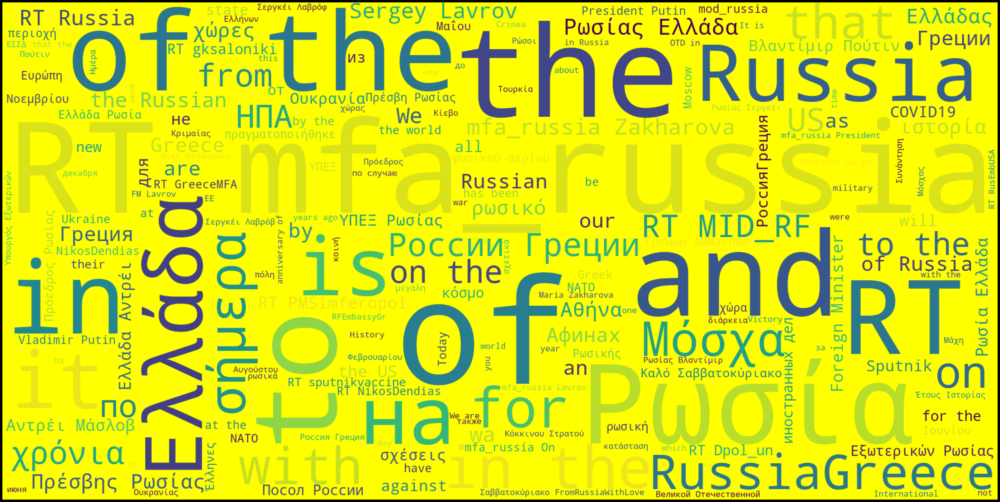

In [28]:
wordcloud = WordCloud(
    stopwords = nlp.Defaults.stop_words, 
    width = 2000,
    height = 1000,
    background_color = 'yellow'
 ).generate(text)
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [29]:
from PIL import Image
import numpy as np

In [30]:
doc = nlp(Rus['text'][1])

In [31]:
for token in doc:
    print(token, token.lemma_)

Στις σε ο
2 2
Ιουλίου Ιουλίου
πέθανε πέθανε
ο ο
σκηνοθέτης σκηνοθέτης
και και
σχεδιαστής σχεδιαστής
κινουμένων κινουμένων
σχεδίων σχεδίων
Λεωνίντ Λεωνίντ
# #
Σβάρτσμαν Σβάρτσμαν
. .
Ανάμεσα ανάμεσα
στα σε ο
πολλά πολύς
έργα έργο
του μου
είναι είμαι
η ο
εικόνα εικόνα
του ο
μικρού μικρού
αξιολάτρευτου αξιολάτρευτου
ζώου ζώου
# #
Τσεμπουράσκα Τσεμπουράσκα
, ,
το ο
οποίο οποίος
τώρα τώρα
είναι είμαι
γνωστό γνωστός
και και
αγαπημένο αγαπημένο
σε σε
όλο όλος
τον ο
κόσμο κόσμος
. .
   


In [32]:
' '.join(token.lemma_ for token in doc)

'σε ο 2 Ιουλίου πέθανε ο σκηνοθέτης και σχεδιαστής κινουμένων σχεδίων Λεωνίντ # Σβάρτσμαν . ανάμεσα σε ο πολύς έργο μου είμαι ο εικόνα ο μικρού αξιολάτρευτου ζώου # Τσεμπουράσκα , ο οποίος τώρα είμαι γνωστός και αγαπημένο σε όλος ο κόσμος .  '

In [33]:
text

'🎨 Στις 2 Ιουλίου του 1839 γεννήθηκε ο #Ρώσος ζωγράφος, μέλος των «Περιπλανώμενων» Κωνσταντίν #Μακόφσκι Ας θυμηθούμε τα θαυμάσια έργα του1 Η αυτοπροσωπογραφία (1856)2 Η Χριστουγεννιάτικη μαντεία (1905)3 Ο γάμος των βογιάρων (1883)4 Η τυφλόμυγα (1891)  Στις 2 Ιουλίου πέθανε ο σκηνοθέτης και σχεδιαστής κινουμένων σχεδίων Λεωνίντ #Σβάρτσμαν Ανάμεσα στα πολλά έργα του είναι η εικόνα του μικρού αξιολάτρευτου ζώου #Τσεμπουράσκα, το οποίο τώρα είναι γνωστό και αγαπημένο σε όλο τον κόσμο  🎉 #Σανσήμερα το 1860 ιδρύθηκε η πόλη #Βλαδιβοστόκ («κυριαρχώ την Ανατολή» από τα ρωσικά), ο μεγαλύτερος λιμένας της Ρωσίας στον Ειρηνικό ωκεανό 🌉 Εδώ βρίσκεται η μεγαλύτερη σε μήκος ανοιγμάτων καλωδιωτή γέφυρα #Ρούσκι  💬 Μαρία #ΖαχάροβαΣτα απελευθερωμένα εδάφη τακτοποιείται η ειρηνική ζωή, αποκαθίστανται η οικονομία και η βιομηχανία, ανοικοδομούνται οι υποδομές, αρχίζουν να εργάζονται οι επιχειρήσεις, ανοίγουν νηπιαγωγεία, πολυκλινικές και νοσοκομεία  🎊 Σαν σήμερα το 1889 γεννήθηκε η εξάιρετη Σοβιετική γλύπτρ

In [34]:
full_doc = nlp(text)
clear_text = ' '.join(token.lemma_ for token in full_doc)
clear_text[200:400]

'3 ο γάμος ο βογιάρων ( 1883)4 ο τυφλόμυγα ( 1891 )   σε ο 2 Ιουλίου πέθανε ο σκηνοθέτης και σχεδιαστής κινουμένων σχεδίων Λεωνίντ # Σβάρτσμαν ανάμεσα σε ο πολύς έργο μου είμαι ο εικόνα ο μικρού αξιολά'

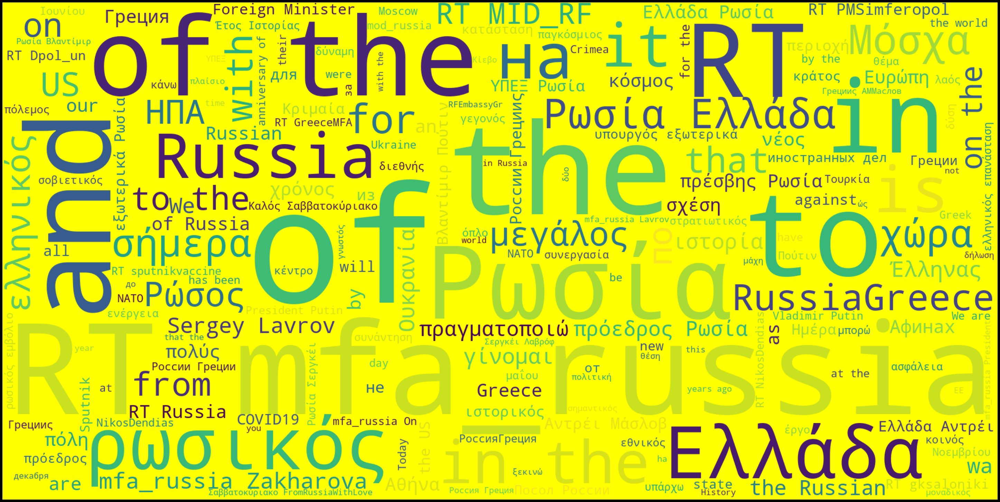

In [35]:
wordcloud = WordCloud(
    stopwords = nlp.Defaults.stop_words,
    width = 2000,
    height = 1000,
    background_color = 'yellow'
 ).generate(clear_text)
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [36]:
from collections import Counter
Counter(" ".join(Rus["text"]).split()).most_common(16)

[('της', 1633),
 ('του', 1370),
 ('RT', 1194),
 ('the', 1179),
 ('και', 1032),
 ('of', 879),
 ('την', 775),
 ('в', 768),
 ('το', 676),
 ('για', 604),
 ('στην', 595),
 ('των', 512),
 ('η', 509),
 ('🔗', 501),
 ('από', 496),
 ('με', 496)]

In [37]:
for word in nlp.Defaults.stop_words:
  print(word)
  break

ποιούς


In [38]:
Rus['text_no_stopwords'] = Rus['text'].apply(lambda x: ' '.join([word for word in x.split() if word not in (nlp.Defaults.stop_words) and word != ':' and word != '\n' and word != "amp" and word != 'rt' and word != ',']))
Rus['text_no_stopwords'] = Rus['text'].apply(lambda x: ' '.join([word for word in x.split() if word not in (nlp.Defaults.stop_words)]))
Rus['clean_text_no_stopwords'] = Rus['text']
#for stopword in nlp.Defaults.stop_words:
Rus['clean_text_no_stopwords'] = Rus['clean_text_no_stopwords'].apply(lambda x: ' '.join([word for word in x.split() if word not in nlp.Defaults.stop_words and word != "ή" and word != "ία" and word != "κι"]))
Rus['clean_text_no_stopwords'] = Rus['clean_text_no_stopwords'].apply(lambda x: x.replace("amp", "").strip())
Rus['clean_text_no_stopwords'] = Rus['clean_text_no_stopwords'].apply(lambda x: x.replace("rt", "").strip())
Rus['clean_text_no_stopwords'] = Rus['clean_text_no_stopwords'].apply(lambda x: x.replace(":", "").strip())
Rus['clean_text_no_stopwords'] = Rus['clean_text_no_stopwords'].apply(lambda x: x.replace(",", "").strip())
Rus['clean_text_no_stopwords'] = Rus['clean_text_no_stopwords'].apply(lambda x: x.replace("\n", "").strip())
Rus['clean_text_no_stopwords'] = Rus['clean_text_no_stopwords'].apply(lambda x: x.replace(".", "").strip())

In [39]:
freq = Counter(" ".join(Rus["clean_text_no_stopwords"]).split()).most_common(16)
freq

[('RT', 1195),
 ('the', 1179),
 ('of', 879),
 ('в', 768),
 ('🔗', 501),
 ('in', 473),
 ('to', 468),
 ('Ρωσίας', 407),
 ('@mfa_russia', 403),
 ('💬', 364),
 ('и', 353),
 ('Η', 330),
 ('🇷🇺', 322),
 ('and', 281),
 ('Ο', 278),
 ('a', 262)]

/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 128279 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 128172 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 127479 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 127482 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:183: RuntimeWarning: Glyph 128279 missing from current font.
  font.set_text(s, 0, flags=flags)
/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:183: RuntimeWarning: Glyph 128172 missing from current font.
  font.

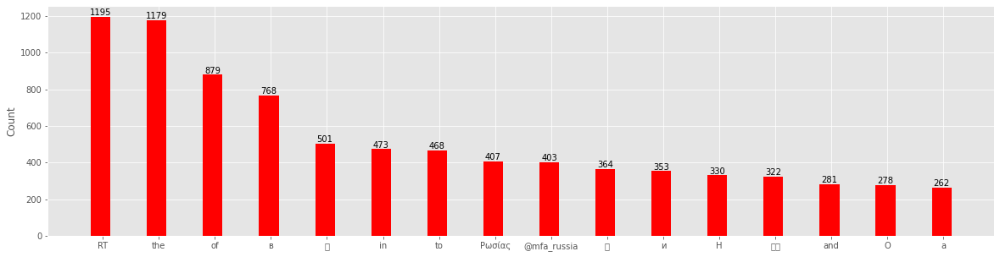

In [40]:
names, values = zip(*freq)
# names = [x[0] for x in data]  # These two lines are equivalent to the the zip-command.
# values = [x[1] for x in data] # These two lines are equivalent to the the zip-command.

ind = np.arange(len(freq))  # the x locations for the groups
width = 0.35       # the width of the bars

fig, ax = plt.subplots(figsize=(20,5))
rects1 = ax.bar(ind, values, width, color='r')
# add some text for labels, title and axes ticks
ax.set_ylabel('Count')
ax.set_xticks(ind+width/10.)
ax.set_xticklabels(names)

def autolabel(rects):
    # attach some text labels
    for rect in rects:
        height = rect.get_height()
        ax.text(rect.get_x() + rect.get_width()/2, height,
                '%d' % int(height),
                ha='center', va='bottom')

autolabel(rects1)

plt.show()

#  vectorizing Rus Embassy

In [41]:
from sklearn.feature_extraction.text import CountVectorizer
cv = CountVectorizer()

In [42]:
count_vector = cv.fit_transform(Rus['text'])

In [43]:
count_vector.shape

(3248, 18606)

In [44]:
#cv.get_feature_names()

results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names()) 

results.head()

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,00,000,01,02,028,03,04,07,08,09,...,яркое,је,ميثاق_الأمم_المتحدة_هو_قواعدنا,ἀγώνας,ἀλεξὰντρ,ἀπὸ,ἐλευθερία,ἐραστὴς,ἑλλήνων,联合国宪章是我们的主张
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [45]:
#cv.vocabulary_

In [46]:
cv = CountVectorizer(stop_words= nlp.Defaults.stop_words, min_df=0.01, max_df=0.95)

In [47]:
count_vector = cv.fit_transform(Rus['text'])

In [48]:
results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names()) 

results.head()

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,00,10,12,15,18,19,1945,20,200,2020,...,на,не,от,по,посол,россии,российских,российской,россия,россиягреция
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [49]:
from html import unescape
def my_tokenizer(doc):
            
    # apply the preprocessing and tokenzation steps
    doc_clean = unescape(doc).lower()
    tokens = nlp(doc_clean)
    lemmatized_tokens = [token.lemma_ for token in tokens if (len(str(token.lemma_))>2)]
            
    # use CountVectorizer's _word_ngrams built in method
    # to remove stop words and extract n-grams
    return(lemmatized_tokens)

In [50]:
cv = CountVectorizer(stop_words= nlp.Defaults.stop_words, min_df=0.01, max_df=0.95, tokenizer=my_tokenizer)
count_vector = cv.fit_transform(Rus['text'])
results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names()) 
results.head()

/usr/local/lib/python3.7/dist-packages/sklearn/feature_extraction/text.py:401: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['έκασε ο', 'έτερα', 'έτερων', 'ήσω', 'ίσιος', 'αλλιώ', 'αλλιώτικος', 'αλλοιώ', 'αρκετός', 'γίνομαι', 'γρήγορο', 'διο', 'είχος', 'εαυτής', 'εαυτός', 'εκάστος', 'επόμενος', 'εσένος', 'ετέραις', 'ετού', 'ετούε ο', 'εχτής', 'ιδίο', 'κάνενς', 'κάνω', 'κανενό', 'λοιπός', 'μέλλω', 'μερικός', 'μπορώ', 'μόνας', 'ολωσδιόλος', 'ορισμένος', 'οριόμενσς', 'ποία', 'πολύς', 'προτός', 'προχτής', 'σε ο', 'ταύ', 'τουλάχισε ο', 'τρίτος', 'τός', 'χωριστό'] not in stop_words.
  % sorted(inconsistent)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,\n\n,...,2020,2021,2022,@dpol_un,@gksaloniki,@greecemfa,@mfa_russia,@mid_rf,...,греция,дел,для,иностранных,посол,россии,российских,российской,россия,россиягреция
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [51]:
cv = CountVectorizer( stop_words= nlp.Defaults.stop_words, max_features=20) #, tokenizer=my_tokenizer)
count_vector = cv.fit_transform(Rus['text'])
results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names()) 
results.head()

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,amp,and,for,in,is,mfa_russia,of,on,rt,russia,russian,the,to,with,ελλάδα,ρωσία,ρωσίας,греции,на,россии
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [52]:
cv = CountVectorizer( stop_words= nlp.Defaults.stop_words, max_features=20, token_pattern = '\\ουκ[α-ωά-ώ]*\\b') #, tokenizer=my_tokenizer)
count_vector = cv.fit_transform(Rus['text'])
results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names()) 
results.head()

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,ουκά,ουκετών,ουκιάνοφ,ουκουδάκη,ουκρανία,ουκρανίας,ουκρανικά,ουκρανικές,ουκρανική,ουκρανικής,ουκρανικη,ουκρανικού,ουκρανικούς,ουκρανικό,ουκρανικός,ουκρανικών,ουκρανοί,ουκρανού,ουκρανούς,ουκρανών
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [53]:
results.sum(axis =0).sort_values(ascending = False)

ουκρανία       38
ουκρανίας      23
ουκρανοί        8
ουκρανικής      7
ουκρανούς       6
ουκρανών        5
ουκρανική       5
ουκρανικά       4
ουκρανικές      4
ουκρανικού      3
ουκρανικό       3
ουκά            3
ουκρανικούς     1
ουκετών         1
ουκρανικός      1
ουκρανικών      1
ουκουδάκη       1
ουκρανού        1
ουκιάνοφ        1
ουκρανικη       1
dtype: int64

In [54]:
sum_words =  results.sum(axis =0)
sum_words.sort_values(ascending = False).head()   

ουκρανία      38
ουκρανίας     23
ουκρανοί       8
ουκρανικής     7
ουκρανούς      6
dtype: int64

In [55]:
cv = CountVectorizer( stop_words= nlp.Defaults.stop_words, max_features=20, #ngram_range=(1, 2), 
 #                    token_pattern = '(\\bπ[οω]ρ[οω]ν[α-ωά-ώ]+\\b') )\| (\\bκυβ[α-ωά-ώ]\\b) #, tokenizer=my_tokenizer)
                     token_pattern = '\\bukraine[a-z0-9-_]*\\b') #, tokenizer=my_tokenizer)
count_vector = cv.fit_transform(Rus['text'])
results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names()) 
results.head()

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,ukraine
0,0
1,0
2,0
3,0
4,0


In [56]:
results.sum(axis =0).sort_values(ascending = False)

ukraine    38
dtype: int64

In [57]:
cv = CountVectorizer( stop_words= nlp.Defaults.stop_words, max_features=20, #ngram_range=(1, 2), 
                     vocabulary = ['Ukraine', 'Ουκρανία' , 'Ρωσια', 'Russia' , 'πολεμος']) #, tokenizer=my_tokenizer)
count_vector = cv.fit_transform(Rus['text'])
results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names()) 
results.head()

/usr/local/lib/python3.7/dist-packages/sklearn/feature_extraction/text.py:1323: UserWarning: Upper case characters found in vocabulary while 'lowercase' is True. These entries will not be matched with any documents
  "Upper case characters found in"
/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,Ukraine,Ουκρανία,Ρωσια,Russia,πολεμος
0,0,0,0,0,0
1,0,0,0,0,0
2,0,0,0,0,0
3,0,0,0,0,0
4,0,0,0,0,0


In [58]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [59]:
tfidf_vectorizer = TfidfVectorizer(stop_words= nlp.Defaults.stop_words, max_features=500)
tfidf_matrix_train = tfidf_vectorizer.fit_transform(Rus['text'])  #finds the tfidf score with normalization

In [60]:
results = pd.DataFrame(tfidf_matrix_train.toarray(), columns=tfidf_vectorizer.get_feature_names()) 
results.head()

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,00,000,10,11,12,13,14,15,16,17,...,состоялась,состоялся,сотрудники,сотрудничества,также,участие,февраля,федерации,ходе,что
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [61]:
from sklearn.metrics.pairwise import cosine_similarity

print("cosine scores ==> ",cosine_similarity(tfidf_matrix_train[0:1], tfidf_matrix_train))  #here the first element of tfidf_matrix_train is matched with other three elements


cosine scores ==>  [[1.         0.66047727 0.         ... 0.         0.         0.        ]]


In [62]:
print("cosine scores ==> ",cosine_similarity(tfidf_matrix_train, tfidf_matrix_train))  #here the first element of tfidf_matrix_train is matched with other three elements


cosine scores ==>  [[1.         0.66047727 0.         ... 0.         0.         0.        ]
 [0.66047727 1.         0.         ... 0.         0.         0.        ]
 [0.         0.         1.         ... 0.13081312 0.0589531  0.        ]
 ...
 [0.         0.         0.13081312 ... 1.         0.27239147 0.        ]
 [0.         0.         0.0589531  ... 0.27239147 1.         0.        ]
 [0.         0.         0.         ... 0.         0.         1.        ]]


In [63]:
arr = cosine_similarity(tfidf_matrix_train, tfidf_matrix_train)

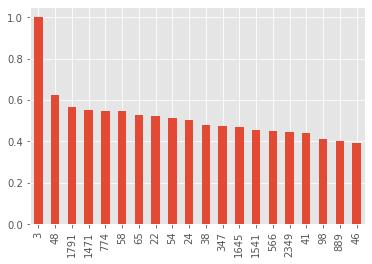

In [64]:
pd.DataFrame(arr).loc[3].sort_values(ascending = False).head(20).plot(kind = 'bar')

In [65]:
Rus['text'].loc[3]

'💬 Μαρία #Ζαχάροβα:\n\nΣτα απελευθερωμένα εδάφη τακτοποιείται η ειρηνική ζωή, αποκαθίστανται η οικονομία και η βιομηχανία, ανοικοδομούνται οι υποδομές, αρχίζουν να εργάζονται οι επιχειρήσεις, ανοίγουν νηπιαγωγεία, πολυκλινικές και νοσοκομεία.  '

In [66]:
Rus['text'].loc[2823]

'RT @protothema: Με διάταγμα Πούτιν επιδόθηκε ρωσικό μετάλλιο στον Μίκη Θεοδωράκη  '

# Emolex Rus Embassy

In [67]:
filepath = "https://raw.githubusercontent.com/datajour-gr/Data_journalism/master/week10/NRC_GREEK_Translated_6_2020.csv"
emolex_df = pd.read_csv(filepath)
emolex_df.head()

,word,Positive,Negative,Anger,Anticipation,Disgust,Fear,Joy,Sadness,Surprise,Trust
0,αφεση,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,ενορκη βεβαιωση,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,εχοντας,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,εχω,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,οριο,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [68]:
emolex_df.tail()

,word,Positive,Negative,Anger,Anticipation,Disgust,Fear,Joy,Sadness,Surprise,Trust
13166,ουρλιασμα,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
13167,κροκος αυγου,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13168,νεοτερος,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13169,ζεφυρος,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13170,ζουμ,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [69]:
emolex_df = emolex_df.drop_duplicates(subset=['word'])
emolex_df = emolex_df.dropna()
emolex_df.reset_index(drop = True, inplace = True)

In [70]:
emolex_df.tail()

,word,Positive,Negative,Anger,Anticipation,Disgust,Fear,Joy,Sadness,Surprise,Trust
13156,ουρλιασμα,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
13157,κροκος αυγου,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13158,νεοτερος,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13159,ζεφυρος,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13160,ζουμ,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [71]:
import spacy
nlp = spacy.load('el_core_news_sm')

In [72]:
Rus_tweets_df = pd.read_csv("/content/gdrive/My Drive/Colab Notebooks/Rus.tsv", sep='\t')

In [73]:
len(Rus_tweets_df)

3248

In [74]:
short_tweets_Rus = Rus_tweets_df[['created_at','full_text' ]]
short_tweets_Rus = short_tweets_Rus.rename(columns={'created_at': 'date', 'full_text': 'text'} )

In [75]:
short_tweets_Rus.tail()

,date,text
3243,Mon Nov 11 10:03:38 +0000 2019,Российские дипломаты на финишной прямой Афинск...
3244,Sun Nov 10 09:32:05 +0000 2019,Τώρα: Ο 37ς Αυθεντικός Μαραθώνιος - η γιορτή ζ...
3245,Sat Nov 09 17:34:39 +0000 2019,Βίντεο: Ο Πρόεδρος της Ρωσίας Βλ.Πούτιν απένει...
3246,Fri Nov 08 14:20:31 +0000 2019,Ο Υφυπουργός Εξωτερικών της Ρωσίας Αλεκσάντερ ...
3247,Thu Nov 07 17:26:48 +0000 2019,Посольство России в Греции неизменно оказывает...


In [76]:
short_tweets_Rus.dtypes

date    object
text    object
dtype: object

In [77]:
short_tweets_Rus['date'] = pd.to_datetime(short_tweets_Rus['date'], format='%a %b %d %H:%M:%S +0000 %Y')

In [78]:
short_tweets_Rus['year'] = pd.DatetimeIndex(short_tweets_Rus['date']).year
short_tweets_Rus['month'] = pd.DatetimeIndex(short_tweets_Rus['date']).month
short_tweets_Rus['day'] = pd.DatetimeIndex(short_tweets_Rus['date']).day
short_tweets_Rus

,date,text,year,month,day
0,2022-07-03 10:40:13,🎨 Στις 2 Ιουλίου του 1839 γεννήθηκε ο #Ρώσος ζ...,2022,7,3
1,2022-07-02 21:22:52,Στις 2 Ιουλίου πέθανε ο σκηνοθέτης και σχεδιασ...,2022,7,2
2,2022-07-02 13:41:44,🎉 #Σανσήμερα το 1860 ιδρύθηκε η πόλη #Βλαδιβοσ...,2022,7,2
3,2022-07-02 12:16:23,💬 Μαρία #Ζαχάροβα:\n\nΣτα απελευθερωμένα εδάφη...,2022,7,2
4,2022-07-01 18:56:39,🎊 Σαν σήμερα το 1889 γεννήθηκε η εξάιρετη Σοβι...,2022,7,1
...,...,...,...,...,...
3243,2019-11-11 10:03:38,Российские дипломаты на финишной прямой Афинск...,2019,11,11
3244,2019-11-10 09:32:05,Τώρα: Ο 37ς Αυθεντικός Μαραθώνιος - η γιορτή ζ...,2019,11,10
3245,2019-11-09 17:34:39,Βίντεο: Ο Πρόεδρος της Ρωσίας Βλ.Πούτιν απένει...,2019,11,9
3246,2019-11-08 14:20:31,Ο Υφυπουργός Εξωτερικών της Ρωσίας Αλεκσάντερ ...,2019,11,8


In [79]:
short_tweets_Rus.dtypes

date     datetime64[ns]
text             object
year              int64
month             int64
day               int64
dtype: object

In [80]:
emolex_df['word'].head(3)

0              αφεση
1    ενορκη βεβαιωση
2            εχοντας
Name: word, dtype: object

In [81]:
short_tweets_Rus['text'] = short_tweets_Rus['text'].str.replace(r'https?:\/\/.*[\r\n]*'," ")

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning: The default value of regex will change from True to False in a future version.
  """Entry point for launching an IPython kernel.


In [82]:
short_tweets_Rus.head()

,date,text,year,month,day
0,2022-07-03 10:40:13,🎨 Στις 2 Ιουλίου του 1839 γεννήθηκε ο #Ρώσος ζ...,2022,7,3
1,2022-07-02 21:22:52,Στις 2 Ιουλίου πέθανε ο σκηνοθέτης και σχεδιασ...,2022,7,2
2,2022-07-02 13:41:44,🎉 #Σανσήμερα το 1860 ιδρύθηκε η πόλη #Βλαδιβοσ...,2022,7,2
3,2022-07-02 12:16:23,💬 Μαρία #Ζαχάροβα:\n\nΣτα απελευθερωμένα εδάφη...,2022,7,2
4,2022-07-01 18:56:39,🎊 Σαν σήμερα το 1889 γεννήθηκε η εξάιρετη Σοβι...,2022,7,1


In [83]:
vec = CountVectorizer(analyzer = 'word', vocabulary = emolex_df.word, 
                      strip_accents = 'unicode',  
                      stop_words= nlp.Defaults.stop_words,
                      ngram_range=(1, 2))

In [84]:
#from sklearn.feature_extraction.text import TfidfVectorizer
#CountVectorizer(stop_words='english', binary=True)
# Θέλω να ελέγξω μόνο τις λέξεις που υπάρχουν στο συναισθηματικό λεξικό

#CountVectorizer(analyzer = 'word', 
#              strip_accents = 'unicode', 
#               token_pattern='[Α-Ωα-ωΆ-Ώά-ώ]{2,}', 
#               stop_words= lc_stop_words_df['stop_w'].tolist())


matrix = vec.fit_transform(short_tweets_Rus['text'])
vocab = vec.get_feature_names()
wordcount_df = pd.DataFrame(matrix.toarray(), columns=vocab)
wordcount_df.head()

/usr/local/lib/python3.7/dist-packages/sklearn/feature_extraction/text.py:1323: UserWarning: Upper case characters found in vocabulary while 'lowercase' is True. These entries will not be matched with any documents
  "Upper case characters found in"
/usr/local/lib/python3.7/dist-packages/sklearn/feature_extraction/text.py:401: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['αδιακοπα', 'ακομα', 'ακομη', 'ακριβως', 'αλλα', 'αλλαχου', 'αλλες', 'αλλη', 'αλλην', 'αλλης', 'αλλιως', 'αλλιωτικα', 'αλλο', 'αλλοι', 'αλλοιως', 'αλλοιωτικα', 'αλλον', 'αλλος', 'αλλοτε', 'αλλου', 'αλλους', 'αλλων', 'αμα', 'αμεσα', 'αμεσως', 'ανα', 'αναμεσα', 'αναμεταξυ', 'ανευ', 'αντι', 'αντιπερα', 'αντις', 'ανω', 'ανωτερω', 'αξαφνα', 'απεναντι', 'απο', 'αποψε', 'αρα', 'αραγε', 'αρκετα', 'αρκετες', 'αρχικα', 'αυριο', 'αυτα', 'αυτες', 'αυτη', 'αυτην', 'αυτης', 'αυτο', 'αυτοι', 'αυτον', 'αυτος', 'αυτου', 'αυτους', 'αυτων', 'αφοτου', 'αφου', 'βεβαια

,αφεση,ενορκη βεβαιωση,εχοντας,εχω,οριο,ορμος,υδρα,αγια τραπεζα,αμην,απατσι,...,κλητηριο ενταλμα,κατειργασμενος,μαγια,κιτρινο,κιτρινιζω,ουρλιασμα,κροκος αυγου,νεοτερος,ζεφυρος,ζουμ
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [85]:
wordcount_df.shape

(3248, 13161)

In [86]:
emolex_df.head()

,word,Positive,Negative,Anger,Anticipation,Disgust,Fear,Joy,Sadness,Surprise,Trust
0,αφεση,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,ενορκη βεβαιωση,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,εχοντας,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,εχω,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,οριο,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [87]:
emolex_df[emolex_df.Anger == 1].tail()

,word,Positive,Negative,Anger,Anticipation,Disgust,Fear,Joy,Sadness,Surprise,Trust
13094,διεξοδος,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13096,ζωυφια,0.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0
13100,θυματοποιω,0.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0
13128,αποτυχημενος,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
13156,ουρλιασμα,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0


In [88]:
# Φτιάξε μια λίστα με positive words

angry_words = emolex_df[emolex_df.Anger == 1]['word']

positive_words = emolex_df[emolex_df.Positive == 1]['word']


# Φτιάξε μια λίστα με sadness words
sadness_words = emolex_df[emolex_df.Sadness == 1]['word']


# Φτιάξε μια λίστα με surprise words
surprise_words = emolex_df[emolex_df.Surprise == 1]['word']


# Φτιάξε μια λίστα με disgust words
disgust_words = emolex_df[emolex_df.Disgust == 1]['word']


# Φτιάξε μια λίστα με anticipation words
anticipation_words = emolex_df[emolex_df.Anticipation == 1]['word']


# Φτιάξε μια λίστα με negative words
negative_words = emolex_df[emolex_df.Negative == 1]['word']



# Φτιάξε μια λίστα με joy words
joy_words = emolex_df[emolex_df.Joy == 1]['word']


# Φτιάξε μια λίστα με trust words
trust_words = emolex_df[emolex_df.Trust == 1]['word']



# Φτιάξε μια λίστα με fear words
fear_words = emolex_df[emolex_df.Fear == 1]['word']


In [89]:
short_tweets_Rus.head(3)

,date,text,year,month,day
0,2022-07-03 10:40:13,🎨 Στις 2 Ιουλίου του 1839 γεννήθηκε ο #Ρώσος ζ...,2022,7,3
1,2022-07-02 21:22:52,Στις 2 Ιουλίου πέθανε ο σκηνοθέτης και σχεδιασ...,2022,7,2
2,2022-07-02 13:41:44,🎉 #Σανσήμερα το 1860 ιδρύθηκε η πόλη #Βλαδιβοσ...,2022,7,2


In [90]:
short_tweets_Rus['anger'] = wordcount_df[angry_words].sum(axis=1)

short_tweets_Rus['positivity'] = wordcount_df[positive_words].sum(axis=1)


short_tweets_Rus['joy'] = wordcount_df[joy_words].sum(axis=1)


short_tweets_Rus['disgust'] = wordcount_df[disgust_words].sum(axis=1)


short_tweets_Rus['surprise'] = wordcount_df[surprise_words].sum(axis=1)

short_tweets_Rus['trust'] = wordcount_df[trust_words].sum(axis=1)


short_tweets_Rus['anticipation'] = wordcount_df[anticipation_words].sum(axis=1)


short_tweets_Rus['sadness'] = wordcount_df[sadness_words].sum(axis=1)

short_tweets_Rus['negative'] = wordcount_df[negative_words].sum(axis=1)

short_tweets_Rus['fear'] = wordcount_df[fear_words].sum(axis=1)


In [91]:
short_tweets_Rus

,date,text,year,month,day,anger,positivity,joy,disgust,surprise,trust,anticipation,sadness,negative,fear
0,2022-07-03 10:40:13,🎨 Στις 2 Ιουλίου του 1839 γεννήθηκε ο #Ρώσος ζ...,2022,7,3,0,2,2,0,0,1,2,0,0,0
1,2022-07-02 21:22:52,Στις 2 Ιουλίου πέθανε ο σκηνοθέτης και σχεδιασ...,2022,7,2,0,1,0,1,0,1,0,0,2,1
2,2022-07-02 13:41:44,🎉 #Σανσήμερα το 1860 ιδρύθηκε η πόλη #Βλαδιβοσ...,2022,7,2,1,3,0,1,1,1,0,0,1,1
3,2022-07-02 12:16:23,💬 Μαρία #Ζαχάροβα:\n\nΣτα απελευθερωμένα εδάφη...,2022,7,2,0,0,0,0,0,1,0,0,0,0
4,2022-07-01 18:56:39,🎊 Σαν σήμερα το 1889 γεννήθηκε η εξάιρετη Σοβι...,2022,7,1,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3243,2019-11-11 10:03:38,Российские дипломаты на финишной прямой Афинск...,2019,11,11,0,0,0,0,0,0,0,0,0,0
3244,2019-11-10 09:32:05,Τώρα: Ο 37ς Αυθεντικός Μαραθώνιος - η γιορτή ζ...,2019,11,10,0,2,2,0,1,3,1,0,1,0
3245,2019-11-09 17:34:39,Βίντεο: Ο Πρόεδρος της Ρωσίας Βλ.Πούτιν απένει...,2019,11,9,1,1,0,0,0,1,0,0,0,0
3246,2019-11-08 14:20:31,Ο Υφυπουργός Εξωτερικών της Ρωσίας Αλεκσάντερ ...,2019,11,8,0,0,0,0,0,0,0,0,0,0


In [92]:
max = 0
happiest_tweet = ""
for i in range(0,len(short_tweets_Rus)):
  #print(short_tweets_Rus.iloc[i]['positivity'])
  if short_tweets_Rus.iloc[i]['positivity'] > max:
    happiest_tweet = short_tweets_Rus.iloc[i]['text']
    max = short_tweets_Rus.iloc[i]['positivity']


happiest_tweet

'Ο Πρόεδρος της Ρωσίας Βλαντίμιρ #Πούτιν ευχήθηκε σε όσους γιορτάζουν τα Χριστούγεννα στις 7 Ιανουαρίου υγεία, επιτυχία, ευημερία και εκπλήρωση των επιθυμιών.\nΟ Ρώσος Πρόεδρος παρευρέθηκε τα Χριστούγεννα στην εκκλησία του Αγίου Νικολάου στην περιοχή του Νόβγκοροντ #Ρωσία.  '

In [93]:
max = 0
negative_tweet = ""
for i in range(0,len(short_tweets_Rus)):
  #print(short_tweets_Rus.iloc[i]['positivity'])
  if short_tweets_Rus.iloc[i]['negative'] > max:
    negative_tweet = short_tweets_Rus.iloc[i]['text']
    max = short_tweets_Rus.iloc[i]['negative']


negative_tweet

'💬 Ο Υπουργός Εξωτερικών της Ρωσίας Σεργκέι Λαβρόφ:\n❗️Έχουμε συζητήσει με τη Δύση το πρόβλημα της δημοκρατίας. Μόλις τους προτείνουμε να συμφωνήσουμε στο οτι η δημοκρατία πρέπει να θριαμβεύσει και στις διεθνείς σχέσεις, ο ενθουσιασμός τους εξαφανίζεται.\n🔗  '

In [94]:
max = 0
saddest_tweet = ""
for i in range(0,len(short_tweets_Rus)):
  #print(short_tweets_Rus.iloc[i]['positivity'])
  if short_tweets_Rus.iloc[i]['sadness'] > max:
    saddest_tweet = short_tweets_Rus.iloc[i]['text']
    max = short_tweets_Rus.iloc[i]['sadness']

saddest_tweet

"🔈Ρώσος ΥΠΕΞ Σ.Λαβρόφ:\n💬 Ο Β.Ζελένσκι βασίζεται στην επίλυση της σύγκρουσης μέσω της εμπλοκής του ΝΑΤΟ σε αυτήν, και όχι μέσω συνομιλιών. Απ' ότι φαίνεται επιδιώκει να προκαλέσει σύγκρουση μεταξύ ΝΑΤΟ και Ρωσίας  "

In [95]:
max = 0
fear_tweet = ""
for i in range(0,len(short_tweets_Rus)):
  #print(short_tweets_Rus.iloc[i]['positivity'])
  if short_tweets_Rus.iloc[i]['fear'] > max:
    fear_tweet = short_tweets_Rus.iloc[i]['text']
    max = short_tweets_Rus.iloc[i]['fear']

fear_tweet

'✈️ Ο εχθρός όπως τον βλέπουν οι Ρώσοι πιλότοι του Beriev-200. Ρίψεις νερού στο μέτωπο της Εύβοιας.\n\nΟ γίγαντας Beriev επιχειρεί ασταμάτητα.\nΌλοι ευχόμαστε ο πόλεμος με τη φωτιά να κερδηθεί το συντομότερο.  '

In [96]:
max = 0
trust_tweet = ""
for i in range(0,len(short_tweets_Rus)):
  #print(short_tweets_Rus.iloc[i]['positivity'])
  if short_tweets_Rus.iloc[i]['trust'] > max:
    trust_tweet = short_tweets_Rus.iloc[i]['text']
    max = short_tweets_Rus.iloc[i]['trust']

trust_tweet

'#Lavrov🇷🇺\n\n💬 Γιατί κανένας δυτικός δημοσιογράφος δεν κάλυπτε σε τακτική βάση τα γεγονότα στη γραμμή επαφής στο Ντονμπάς, που ελέγχεται από την Ουκρανική κυβέρνηση, όλα αυτά τα οκτώ χρόνια; \n\n🔗  '

In [97]:
short_tweets_Rus.set_index('date' , inplace=True)

In [98]:
import matplotlib.pyplot as plt
plt.style.use('ggplot')

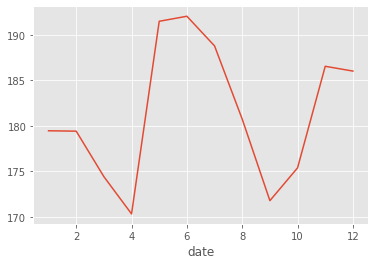

In [99]:
short_tweets_Rus['text'].str.len().groupby(by=short_tweets_Rus.index.month).mean().plot()

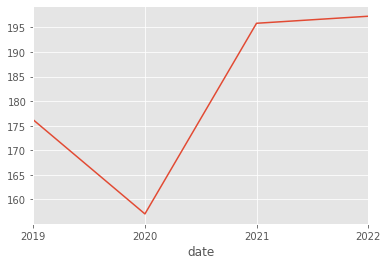

In [100]:
short_tweets_Rus['text'].str.len().resample('A').mean().plot() 

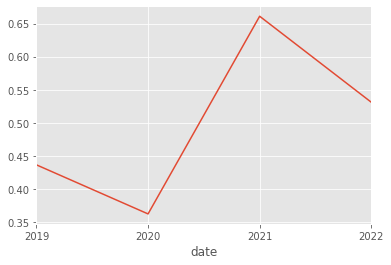

In [101]:
short_tweets_Rus['positivity'].resample('A').mean().plot() 

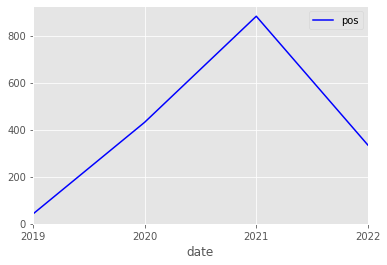

In [102]:
short_tweets_Rus['positivity'].resample('A').sum().plot(color = 'b',label = 'pos').legend() 

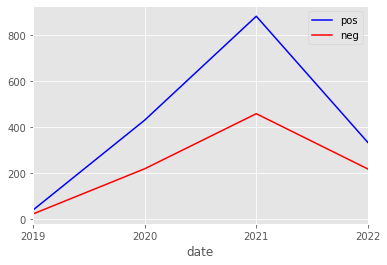

In [103]:
short_tweets_Rus['positivity'].resample('A').sum().plot(color = 'b',label = 'pos').legend() 
short_tweets_Rus['negative'].resample('A').sum().plot(color = 'r',label = 'neg').legend() 

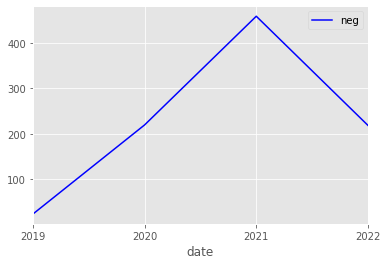

In [104]:
short_tweets_Rus['negative'].resample('A').sum().plot(color = 'b',label = 'neg').legend() 

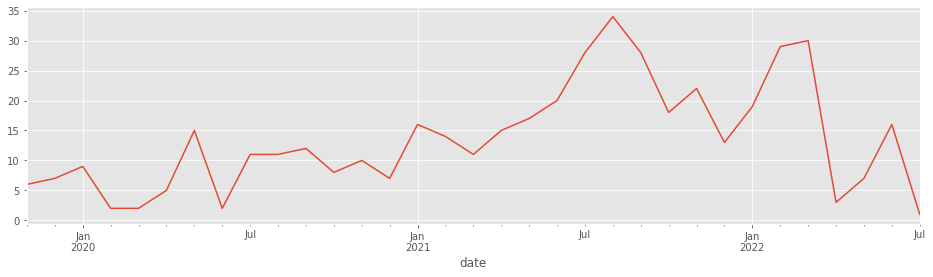

In [105]:
short_tweets_Rus['anger'].resample('M').sum().plot(figsize=(16,4))

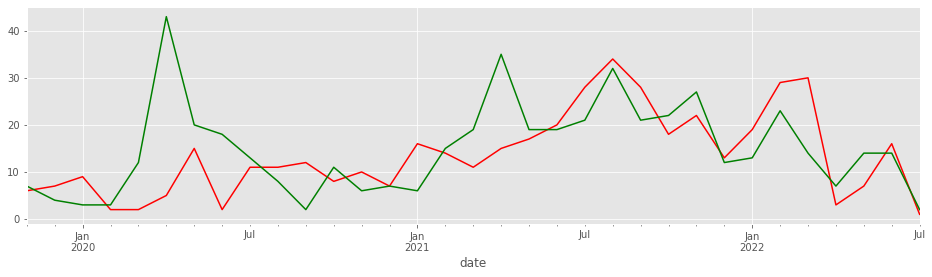

In [106]:
ax = short_tweets_Rus['anger'].resample('M').sum().plot(figsize=(16,4), color = 'red')
short_tweets_Rus['joy'].resample('M').sum().plot(figsize=(16,4), ax = ax, color = 'green')

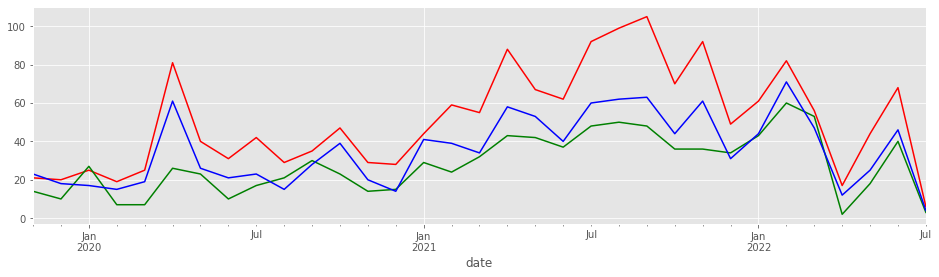

In [107]:
ax = short_tweets_Rus['positivity'].resample('M').sum().plot(figsize=(16,4), color = 'red')
short_tweets_Rus['negative'].resample('M').sum().plot(figsize=(16,4), ax = ax, color = 'green')
short_tweets_Rus['trust'].resample('M').sum().plot(figsize=(16,4), ax = ax, color = 'blue')

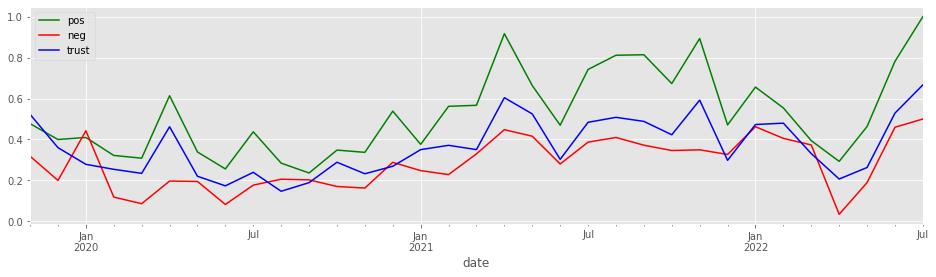

In [108]:
ax = short_tweets_Rus['positivity'].resample('M').mean().plot(figsize=(16,4), 
                                                          color = 'g', label='pos')
short_tweets_Rus['negative'].resample('M').mean().plot(figsize=(16,4), ax = ax, 
                                                   label = 'neg', color = 'r')
short_tweets_Rus['trust'].resample('M').mean().plot(figsize=(16,4), ax = ax, 
                                                label = 'trust',color = 'blue').legend()

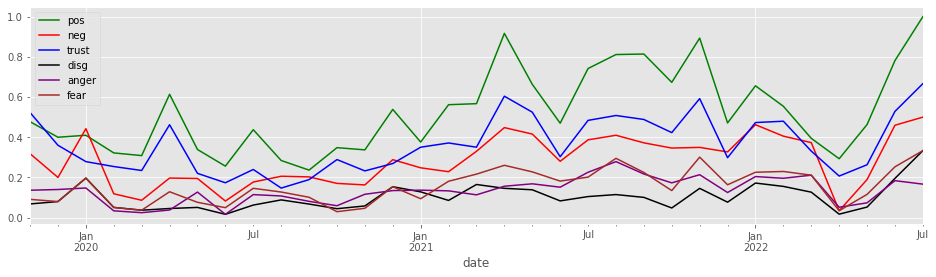

In [109]:
plt.style.use('ggplot')
ax = short_tweets_Rus['positivity'].resample('M').mean().plot(figsize=(16,4), 
                                                          color = 'g', label='pos')
short_tweets_Rus['negative'].resample('M').mean().plot(figsize=(16,4), ax = ax, 
                                                   label = 'neg', color = 'r')
short_tweets_Rus['trust'].resample('M').mean().plot(figsize=(16,4), ax = ax, 
                                                label = 'trust',color = 'blue').legend()

short_tweets_Rus['disgust'].resample('M').mean().plot(figsize=(16,4), ax = ax, 
                                                label = 'disg',color = 'black').legend() 

short_tweets_Rus['anger'].resample('M').mean().plot(figsize=(16,4), ax = ax, 
                                                label = 'anger',color = 'purple').legend() 

short_tweets_Rus['fear'].resample('M').mean().plot(figsize=(16,4), ax = ax, 
                                                label = 'fear',color = 'brown').legend()    

Text(0, 0.5, 'Years')

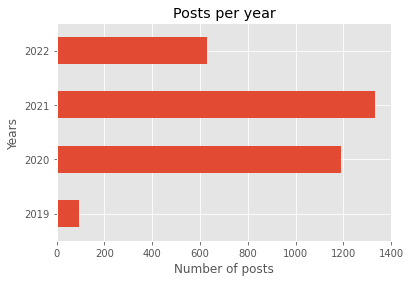

In [110]:
short_tweets_Rus['text'].groupby(by=short_tweets_Rus.index.year).count().plot(kind='barh')
plt.title("Posts per year")
plt.xlabel("Number of posts")
plt.ylabel("Years")

Text(0, 0.5, 'Month of the year')

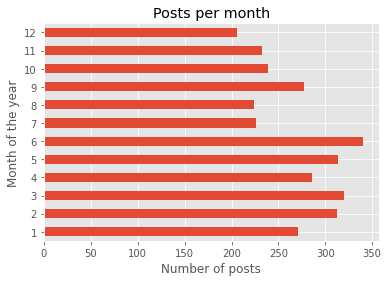

In [111]:
short_tweets_Rus['text'].groupby(by=short_tweets_Rus.index.month).count().plot(kind='barh')
plt.title("Posts per month")
plt.xlabel("Number of posts")
plt.ylabel("Month of the year")

Text(0, 0.5, 'Hour of the day')

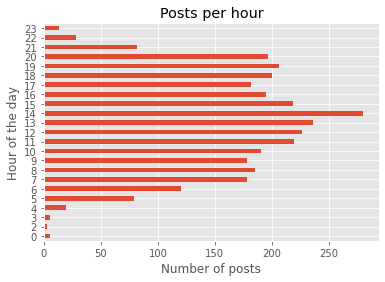

In [112]:
short_tweets_Rus['text'].groupby(by=short_tweets_Rus.index.hour).count().plot(kind='barh')
plt.title("Posts per hour")
plt.xlabel("Number of posts")
plt.ylabel("Hour of the day")

# Ukr Embassy Greece

https://twitter.com/ukringrc

In [113]:
Ukr = []
try:
    user_timeline = twitter.get_user_timeline(screen_name='UKRinGRC',count=200, tweet_mode = 'extended'  )
except TwythonError as e:
    print("Error getting tweets:", e)
print("I Got:", len(user_timeline), " tweets")
for tweet in user_timeline:
    # Add whatever you want from the tweet, here we just add the text
    Ukr.append(tweet)

I Got: 200  tweets


In [114]:
pd.DataFrame(Ukr)

,created_at,id,id_str,full_text,truncated,display_text_range,entities,source,in_reply_to_status_id,in_reply_to_status_id_str,...,favorite_count,favorited,retweeted,lang,extended_entities,possibly_sensitive,quoted_status_id,quoted_status_id_str,quoted_status_permalink,quoted_status
0,Fri Jul 01 04:52:21 +0000 2022,1542732819373383681,1542732819373383681,RT @DmytroKuleba: Russia’s use of the Caspian ...,False,"[0, 139]","{'hashtags': [], 'symbols': [], 'user_mentions...","<a href=""http://twitter.com/download/iphone"" r...",None,None,...,0,False,False,en,NaN,NaN,NaN,NaN,NaN,NaN
1,Fri Jul 01 04:52:12 +0000 2022,1542732781834457091,1542732781834457091,"RT @MFA_Ukraine: For the last week, #Russia in...",False,"[0, 140]","{'hashtags': [{'text': 'Russia', 'indices': [3...","<a href=""http://twitter.com/download/iphone"" r...",None,None,...,0,False,False,en,NaN,NaN,NaN,NaN,NaN,NaN
2,Fri Jul 01 04:51:49 +0000 2022,1542732684820205568,1542732684820205568,RT @MFA_Ukraine: #Ukraine strongly condemns th...,False,"[0, 140]","{'hashtags': [{'text': 'Ukraine', 'indices': [...","<a href=""http://twitter.com/download/iphone"" r...",None,None,...,0,False,False,en,NaN,NaN,NaN,NaN,NaN,NaN
3,Fri Jul 01 04:51:39 +0000 2022,1542732645007859714,1542732645007859714,RT @OlegNikolenko_: Syria’s recognition of the...,False,"[0, 140]","{'hashtags': [], 'symbols': [], 'user_mentions...","<a href=""http://twitter.com/download/iphone"" r...",None,None,...,0,False,False,en,NaN,NaN,NaN,NaN,NaN,NaN
4,Fri Jul 01 04:51:33 +0000 2022,1542732617384173570,1542732617384173570,RT @DmytroKuleba: After Ukraine has defeated R...,False,"[0, 139]","{'hashtags': [], 'symbols': [], 'user_mentions...","<a href=""http://twitter.com/download/iphone"" r...",None,None,...,0,False,False,en,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,Thu Jun 02 12:35:36 +0000 2022,1532340154005917697,1532340154005917697,RT @MFA_Ukraine: 🚍 This is an excursion in Lvi...,False,"[0, 140]","{'hashtags': [{'text': 'Russian', 'indices': [...","<a href=""http://twitter.com/download/iphone"" r...",None,None,...,0,False,False,en,NaN,NaN,NaN,NaN,NaN,NaN
196,Thu Jun 02 12:35:24 +0000 2022,1532340100302086148,1532340100302086148,RT @MFA_Ukraine: This is the story of 16yo Kat...,False,"[0, 140]","{'hashtags': [{'text': 'Mariupol', 'indices': ...","<a href=""http://twitter.com/download/iphone"" r...",None,None,...,0,False,False,en,NaN,NaN,NaN,NaN,NaN,NaN
197,Thu Jun 02 12:35:16 +0000 2022,1532340067129171968,1532340067129171968,RT @MFA_Ukraine: 6yo Sofiia from Dnipro plays ...,False,"[0, 140]","{'hashtags': [{'text': 'ukrainian', 'indices':...","<a href=""http://twitter.com/download/iphone"" r...",None,None,...,0,False,False,en,NaN,NaN,NaN,NaN,NaN,NaN
198,Thu Jun 02 12:35:11 +0000 2022,1532340047932014593,1532340047932014593,"RT @MFA_Ukraine: Maksym, 11 yo, from Pokrovsk,...",False,"[0, 140]","{'hashtags': [{'text': 'Donetsk', 'indices': [...","<a href=""http://twitter.com/download/iphone"" r...",None,None,...,0,False,False,en,NaN,NaN,NaN,NaN,NaN,NaN


In [115]:
# Count could be less than 200, see:
# https://dev.twitter.com/discussions/7513
while len(user_timeline) != 0: 
    try:
        user_timeline = twitter.get_user_timeline(screen_name='UKRinGRC',count=100,
                                                  tweet_mode = 'extended', max_id=user_timeline[len(user_timeline)-1]['id']-1)
    except TwythonError as e:
        print("Error getting tweets:", e)
    if len(user_timeline) > 0:
        print("I Got:", len(user_timeline), " tweets more... Last ID:", user_timeline[len(user_timeline)-1]['id']-1)
    for tweet in user_timeline:
        # Add whatever you want from the tweet, here we just add the text
        Ukr.append(tweet)
# Number of tweets the user has made
print("I got :", len(Ukr), " in total!!!")

I Got: 100  tweets more... Last ID: 1526458096989741060
I Got: 100  tweets more... Last ID: 1521060794322108415
I Got: 100  tweets more... Last ID: 1515973926660284419
I Got: 100  tweets more... Last ID: 1507816893767458820
I Got: 100  tweets more... Last ID: 1503315392684515331
I Got: 100  tweets more... Last ID: 1500097914550501377
I Got: 100  tweets more... Last ID: 1497984584457363457
I Got: 100  tweets more... Last ID: 1493570586945241097
I Got: 100  tweets more... Last ID: 1086932433893761023
I Got: 99  tweets more... Last ID: 1052545899430334463
I Got: 100  tweets more... Last ID: 979644083391090688
I Got: 99  tweets more... Last ID: 944502781427245055
I Got: 100  tweets more... Last ID: 874239813632872447
I Got: 100  tweets more... Last ID: 841716737213104128
I Got: 99  tweets more... Last ID: 826854531644452863
I Got: 100  tweets more... Last ID: 782854992147406847
I Got: 100  tweets more... Last ID: 743011375153303551
I Got: 100  tweets more... Last ID: 717338264840118271
I G

In [116]:
# Number of tweets the user has made
print("I got :", len(Ukr), " in total!!!")
#len(Rus)

I got : 2780  in total!!!


In [117]:
for tweet in Ukr:
    print(tweet['created_at'],tweet['full_text'])

Fri Jul 01 04:52:21 +0000 2022 RT @DmytroKuleba: Russia’s use of the Caspian Sea to fire missiles at Ukraine violates the 2018 Convention on the Caspian Sea Status which…
Fri Jul 01 04:52:12 +0000 2022 RT @MFA_Ukraine: For the last week, #Russia intensified the launch of missiles terrorising people in #Ukraine. 

Kyiv, Kharkiv, Kremenchuk,…
Fri Jul 01 04:51:49 +0000 2022 RT @MFA_Ukraine: #Ukraine strongly condemns the decision of the Syrian Arab Republic to recognize the so-called “independence” of the tempo…
Fri Jul 01 04:51:39 +0000 2022 RT @OlegNikolenko_: Syria’s recognition of the so-called independence of Russian-occupied territories in Donbas is an unfriendly act toward…
Fri Jul 01 04:51:33 +0000 2022 RT @DmytroKuleba: After Ukraine has defeated Russian invaders at the Snake Island, they present their retreat as a ‘gesture of good will’.…
Fri Jul 01 04:51:26 +0000 2022 RT @MFA_Ukraine: 🇺🇦 @ZelenskyyUa: “Ukraine is a state where the highest value is a person. And we are fighting 

In [118]:
#Ukr[0]

In [119]:
Ukr_df = pd.DataFrame(Ukr)
Ukr_df

,created_at,id,id_str,full_text,truncated,display_text_range,entities,source,in_reply_to_status_id,in_reply_to_status_id_str,...,favorite_count,favorited,retweeted,lang,extended_entities,possibly_sensitive,quoted_status_id,quoted_status_id_str,quoted_status_permalink,quoted_status
0,Fri Jul 01 04:52:21 +0000 2022,1542732819373383681,1542732819373383681,RT @DmytroKuleba: Russia’s use of the Caspian ...,False,"[0, 139]","{'hashtags': [], 'symbols': [], 'user_mentions...","<a href=""http://twitter.com/download/iphone"" r...",NaN,None,...,0,False,False,en,NaN,NaN,NaN,NaN,NaN,NaN
1,Fri Jul 01 04:52:12 +0000 2022,1542732781834457091,1542732781834457091,"RT @MFA_Ukraine: For the last week, #Russia in...",False,"[0, 140]","{'hashtags': [{'text': 'Russia', 'indices': [3...","<a href=""http://twitter.com/download/iphone"" r...",NaN,None,...,0,False,False,en,NaN,NaN,NaN,NaN,NaN,NaN
2,Fri Jul 01 04:51:49 +0000 2022,1542732684820205568,1542732684820205568,RT @MFA_Ukraine: #Ukraine strongly condemns th...,False,"[0, 140]","{'hashtags': [{'text': 'Ukraine', 'indices': [...","<a href=""http://twitter.com/download/iphone"" r...",NaN,None,...,0,False,False,en,NaN,NaN,NaN,NaN,NaN,NaN
3,Fri Jul 01 04:51:39 +0000 2022,1542732645007859714,1542732645007859714,RT @OlegNikolenko_: Syria’s recognition of the...,False,"[0, 140]","{'hashtags': [], 'symbols': [], 'user_mentions...","<a href=""http://twitter.com/download/iphone"" r...",NaN,None,...,0,False,False,en,NaN,NaN,NaN,NaN,NaN,NaN
4,Fri Jul 01 04:51:33 +0000 2022,1542732617384173570,1542732617384173570,RT @DmytroKuleba: After Ukraine has defeated R...,False,"[0, 139]","{'hashtags': [], 'symbols': [], 'user_mentions...","<a href=""http://twitter.com/download/iphone"" r...",NaN,None,...,0,False,False,en,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2775,Wed Jun 25 06:33:52 +0000 2014,481686696921022465,481686696921022465,RT @PavloKlimkin: Вперше Україна була запрошен...,False,"[0, 140]","{'hashtags': [], 'symbols': [], 'user_mentions...","<a href=""https://dev.twitter.com/docs/tfw"" rel...",NaN,None,...,0,False,False,uk,NaN,NaN,NaN,NaN,NaN,NaN
2776,Wed Jun 18 09:07:21 +0000 2014,479188608059199488,479188608059199488,RT @MFA_Ukraine: Сьогодні в ООН заслухають доп...,False,"[0, 114]","{'hashtags': [], 'symbols': [], 'user_mentions...","<a href=""http://twitter.com"" rel=""nofollow"">Tw...",NaN,None,...,0,False,False,uk,NaN,False,NaN,NaN,NaN,NaN
2777,Wed Jun 18 09:06:30 +0000 2014,479188394850140161,479188394850140161,RT @ADeshchytsia: Talked to FM @WilliamJHague ...,False,"[0, 140]","{'hashtags': [{'text': 'Ukraine', 'indices': [...","<a href=""http://twitter.com"" rel=""nofollow"">Tw...",NaN,None,...,0,False,False,en,NaN,NaN,NaN,NaN,NaN,NaN
2778,Wed Jun 18 08:20:09 +0000 2014,479176728817172480,479176728817172480,RT @ADeshchytsia: Приношу соболезнования родны...,False,"[0, 139]","{'hashtags': [], 'symbols': [], 'user_mentions...","<a href=""http://twitter.com"" rel=""nofollow"">Tw...",NaN,None,...,0,False,False,ru,NaN,NaN,NaN,NaN,NaN,NaN


In [120]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [121]:
Ukr_df.to_csv("/content/gdrive/My Drive/Colab Notebooks/Ukr_twitter.tsv", sep='\t')

# Ukr df

In [122]:
Ukr = Ukr_df[['created_at','full_text' ]]
Ukr = Ukr.rename(columns={'created_at': 'date', 'full_text': 'text'} )
Ukr

,date,text
0,Fri Jul 01 04:52:21 +0000 2022,RT @DmytroKuleba: Russia’s use of the Caspian ...
1,Fri Jul 01 04:52:12 +0000 2022,"RT @MFA_Ukraine: For the last week, #Russia in..."
2,Fri Jul 01 04:51:49 +0000 2022,RT @MFA_Ukraine: #Ukraine strongly condemns th...
3,Fri Jul 01 04:51:39 +0000 2022,RT @OlegNikolenko_: Syria’s recognition of the...
4,Fri Jul 01 04:51:33 +0000 2022,RT @DmytroKuleba: After Ukraine has defeated R...
...,...,...
2775,Wed Jun 25 06:33:52 +0000 2014,RT @PavloKlimkin: Вперше Україна була запрошен...
2776,Wed Jun 18 09:07:21 +0000 2014,RT @MFA_Ukraine: Сьогодні в ООН заслухають доп...
2777,Wed Jun 18 09:06:30 +0000 2014,RT @ADeshchytsia: Talked to FM @WilliamJHague ...
2778,Wed Jun 18 08:20:09 +0000 2014,RT @ADeshchytsia: Приношу соболезнования родны...


In [123]:
#Ukr.dtypes

In [124]:
Ukr['year'] = pd.DatetimeIndex(Ukr['date']).year
Ukr['month'] = pd.DatetimeIndex(Ukr['date']).month
Ukr['day'] = pd.DatetimeIndex(Ukr['date']).day
Ukr

,date,text,year,month,day
0,Fri Jul 01 04:52:21 +0000 2022,RT @DmytroKuleba: Russia’s use of the Caspian ...,2022,7,1
1,Fri Jul 01 04:52:12 +0000 2022,"RT @MFA_Ukraine: For the last week, #Russia in...",2022,7,1
2,Fri Jul 01 04:51:49 +0000 2022,RT @MFA_Ukraine: #Ukraine strongly condemns th...,2022,7,1
3,Fri Jul 01 04:51:39 +0000 2022,RT @OlegNikolenko_: Syria’s recognition of the...,2022,7,1
4,Fri Jul 01 04:51:33 +0000 2022,RT @DmytroKuleba: After Ukraine has defeated R...,2022,7,1
...,...,...,...,...,...
2775,Wed Jun 25 06:33:52 +0000 2014,RT @PavloKlimkin: Вперше Україна була запрошен...,2014,6,25
2776,Wed Jun 18 09:07:21 +0000 2014,RT @MFA_Ukraine: Сьогодні в ООН заслухають доп...,2014,6,18
2777,Wed Jun 18 09:06:30 +0000 2014,RT @ADeshchytsia: Talked to FM @WilliamJHague ...,2014,6,18
2778,Wed Jun 18 08:20:09 +0000 2014,RT @ADeshchytsia: Приношу соболезнования родны...,2014,6,18


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning: The default value of regex will change from True to False in a future version.
  """Entry point for launching an IPython kernel.


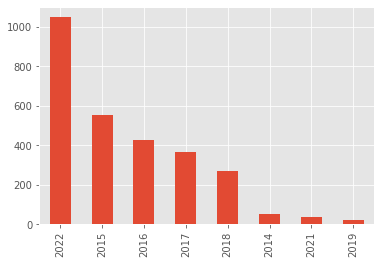

In [125]:
Ukr['text'] = Ukr['text'].str.replace(r'https?:\/\/.*[\r\n]*'," ")
Ukr['year'].value_counts().plot(kind='bar')

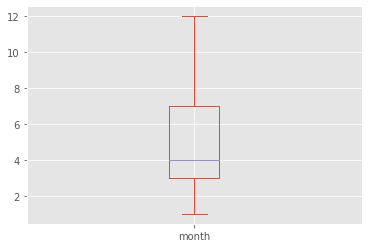

In [126]:
Ukr['month'].plot(kind='box')

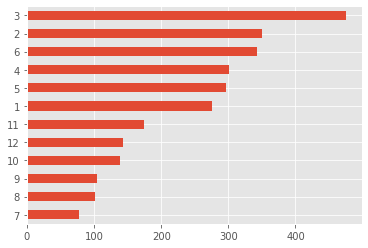

In [127]:
Ukr['month'].value_counts().sort_values(ascending=True).plot(kind='barh')


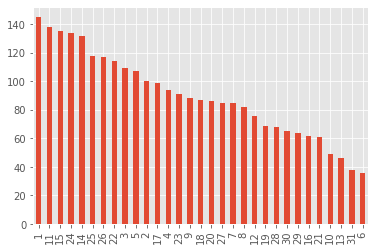

In [128]:
Ukr['day'].value_counts().plot(kind='bar')

In [129]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt

In [130]:
Ukr[Ukr['year']==2022]['text']

0       RT @DmytroKuleba: Russia’s use of the Caspian ...
1       RT @MFA_Ukraine: For the last week, #Russia in...
2       RT @MFA_Ukraine: #Ukraine strongly condemns th...
3       RT @OlegNikolenko_: Syria’s recognition of the...
4       RT @DmytroKuleba: After Ukraine has defeated R...
                              ...                        
1044    RT @NATO: A sovereign, independent and stable ...
1045    RT @JosepBorrellF: In good meeting with PM @De...
1046    On January, 6, the Ukrainian people have speci...
1047    RT @DmytroKuleba: I fully share the point @Jos...
1048    RT @DmytroKuleba: No decisions about Ukraine w...
Name: text, Length: 1049, dtype: object

In [131]:
# Ισως καποτε χρειαστεί να αφαιρέσουμε τους τόνους.....
text = Ukr['text'].str.replace('ά','α').str.replace("έ", "ε").str.replace('ή','η').str.replace('ί','ι').str.replace('ό','ο').str.replace('ύ','υ').str.replace('ώ','ω')
text = Ukr[Ukr['year']==2022]['text'].str.cat(sep = '.').replace("amp", ' ')
text

'RT @DmytroKuleba: Russia’s use of the Caspian Sea to fire missiles at Ukraine violates the 2018 Convention on the Caspian Sea Status which….RT @MFA_Ukraine: For the last week, #Russia intensified the launch of missiles terrorising people in #Ukraine. \n\nKyiv, Kharkiv, Kremenchuk,….RT @MFA_Ukraine: #Ukraine strongly condemns the decision of the Syrian Arab Republic to recognize the so-called “independence” of the tempo….RT @OlegNikolenko_: Syria’s recognition of the so-called independence of Russian-occupied territories in Donbas is an unfriendly act toward….RT @DmytroKuleba: After Ukraine has defeated Russian invaders at the Snake Island, they present their retreat as a ‘gesture of good will’.….RT @MFA_Ukraine: 🇺🇦 @ZelenskyyUa: “Ukraine is a state where the highest value is a person. And we are fighting against the aggressor whose….RT @MFA_Ukraine: “My dad Yosia, 80, was born in #Kharkiv. He worked as an electrician. He was proud of his work at the Kharkiv Polytechnic….RT @MFA_Ukrain

In [132]:
list(STOPWORDS)[0:20]

['its',
 "she's",
 'a',
 "weren't",
 'him',
 'so',
 'an',
 'http',
 "couldn't",
 'they',
 'which',
 'out',
 "shouldn't",
 'myself',
 'could',
 "how's",
 'just',
 "i'd",
 'however',
 'was']

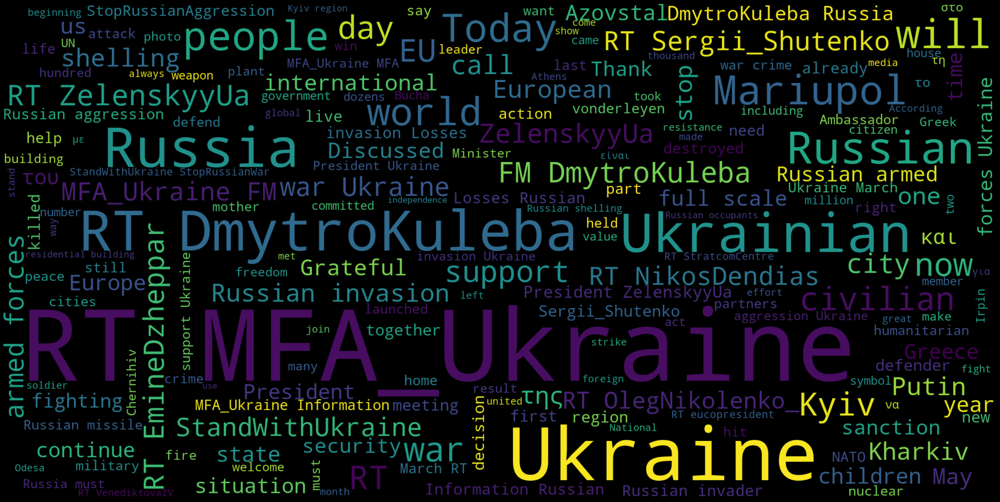

In [133]:
wordcloud = WordCloud(
#   stopwords = STOPWORDS,
    width = 2000,
    height = 1000,
    background_color = 'black'
 ).generate(text)
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [134]:
import spacy
!python -m spacy download el_core_news_sm

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 12.6 MB 5.3 MB/s 
✔ Download and installation successful
You can now load the package via spacy.load('el_core_news_sm')


In [135]:
nlp = spacy.load('el_core_news_sm')

In [136]:
list(nlp.Defaults.stop_words)[0:20]

['ποιούς',
 'έξαφνα',
 'ετέρων',
 'χωριστά',
 'εαυτούς',
 'μόνου',
 'όποιες',
 'πως',
 'θα',
 'οσηνδήποτε',
 'ανά',
 'εις',
 'τις',
 'τάχα',
 'υπόψιν',
 'μόνων',
 'τρεις',
 'όλου',
 'οποιεσδήποτε',
 'έγιναν']

In [137]:
text = Ukr['text'].str.cat(sep = '.').replace('.','').strip()
text = text.replace('amp','').strip()
text = text.replace('rt','').strip()
text = text.replace('\n','').strip()
text = text.replace(':','').strip()
text

'RT @DmytroKuleba Russia’s use of the Caspian Sea to fire missiles at Ukraine violates the 2018 Convention on the Caspian Sea Status which…RT @MFA_Ukraine For the last week, #Russia intensified the launch of missiles terrorising people in #Ukraine Kyiv, Kharkiv, Kremenchuk,…RT @MFA_Ukraine #Ukraine strongly condemns the decision of the Syrian Arab Republic to recognize the so-called “independence” of the tempo…RT @OlegNikolenko_ Syria’s recognition of the so-called independence of Russian-occupied territories in Donbas is an unfriendly act toward…RT @DmytroKuleba After Ukraine has defeated Russian invaders at the Snake Island, they present their retreat as a ‘gesture of good will’…RT @MFA_Ukraine 🇺🇦 @ZelenskyyUa “Ukraine is a state where the highest value is a person And we are fighting against the aggressor whose…RT @MFA_Ukraine “My dad Yosia, 80, was born in #Kharkiv He worked as an electrician He was proud of his work at the Kharkiv Polytechnic…RT @MFA_Ukraine #Russia continues to e

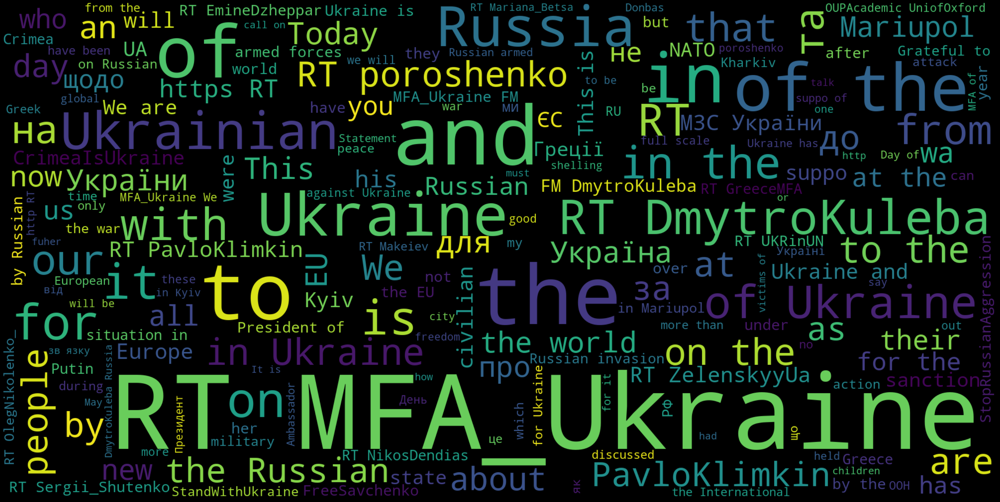

In [138]:
wordcloud = WordCloud(
    stopwords = nlp.Defaults.stop_words, 
    width = 2000,
    height = 1000,
    background_color = 'black'
 ).generate(text)
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [139]:
from PIL import Image
import numpy as np

In [140]:
doc = nlp(Ukr['text'][1])

In [141]:
for token in doc:
    print(token, token.lemma_)

RT RT
@MFA_Ukraine @MFA_Ukraine
: :
For For
the the
last last
week week
, ,
# #
Russia Russia
intensified intensified
the the
launch launch
of of
missiles missiles
terrorising terrorising
people people
in in
# #
Ukraine Ukraine
. .


 


Kyiv Kyiv
, ,
Kharkiv Kharkiv
, ,
Kremenchuk Kremenchuk
, ,
… …


In [142]:
' '.join(token.lemma_ for token in doc)

'RT @MFA_Ukraine : For the last week , # Russia intensified the launch of missiles terrorising people in # Ukraine . \n\n Kyiv , Kharkiv , Kremenchuk , …'

In [143]:
text

'RT @DmytroKuleba Russia’s use of the Caspian Sea to fire missiles at Ukraine violates the 2018 Convention on the Caspian Sea Status which…RT @MFA_Ukraine For the last week, #Russia intensified the launch of missiles terrorising people in #Ukraine Kyiv, Kharkiv, Kremenchuk,…RT @MFA_Ukraine #Ukraine strongly condemns the decision of the Syrian Arab Republic to recognize the so-called “independence” of the tempo…RT @OlegNikolenko_ Syria’s recognition of the so-called independence of Russian-occupied territories in Donbas is an unfriendly act toward…RT @DmytroKuleba After Ukraine has defeated Russian invaders at the Snake Island, they present their retreat as a ‘gesture of good will’…RT @MFA_Ukraine 🇺🇦 @ZelenskyyUa “Ukraine is a state where the highest value is a person And we are fighting against the aggressor whose…RT @MFA_Ukraine “My dad Yosia, 80, was born in #Kharkiv He worked as an electrician He was proud of his work at the Kharkiv Polytechnic…RT @MFA_Ukraine #Russia continues to e

In [144]:
full_doc = nlp(text)
clear_text = ' '.join(token.lemma_ for token in full_doc)
clear_text[200:400]

' launch of missiles terrorising people in # Ukraine Kyiv , Kharkiv , Kremenchuk, … RT @MFA_Ukraine # Ukraine strongly condemns the decision of the Syrian Arab Republic to recognize the so-called “ ind'

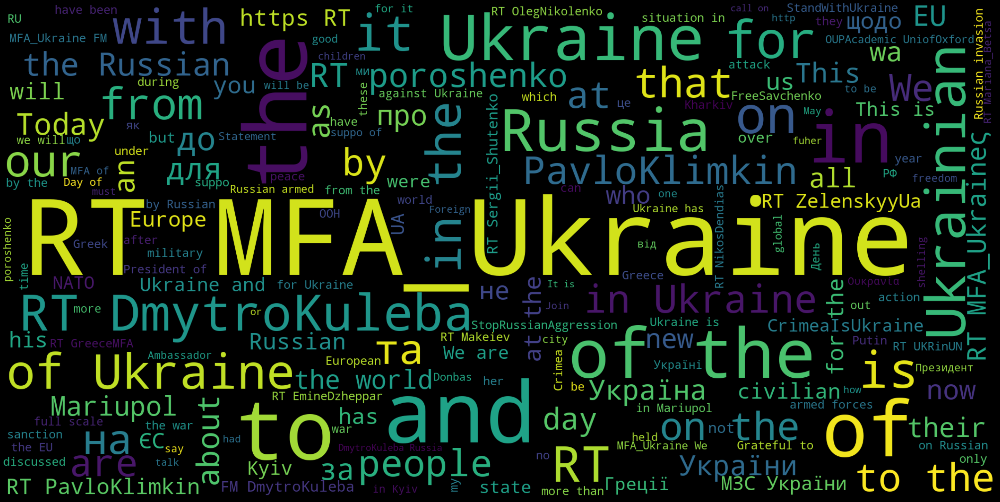

In [145]:
wordcloud = WordCloud(
    stopwords = nlp.Defaults.stop_words,
    width = 2000,
    height = 1000,
    background_color = 'black'
 ).generate(clear_text)
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [146]:
from collections import Counter
Counter(" ".join(Ukr["text"]).split()).most_common(16)

[('RT', 1860),
 ('the', 1354),
 ('of', 1157),
 ('@MFA_Ukraine:', 797),
 ('to', 744),
 ('in', 647),
 ('and', 477),
 ('a', 337),
 ('on', 325),
 ('is', 281),
 ('for', 273),
 ('Ukraine', 247),
 ('в', 207),
 ('Russian', 190),
 ('by', 185),
 ('with', 183)]

In [147]:
for word in nlp.Defaults.stop_words:
  print(word)
  break

ποιούς


In [148]:
Ukr['text_no_stopwords'] = Ukr['text'].apply(lambda x: ' '.join([word for word in x.split() if word not in (nlp.Defaults.stop_words) and word != ':' and word != '\n' and word != "amp" and word != 'rt' and word != ',']))
Ukr['text_no_stopwords'] = Ukr['text'].apply(lambda x: ' '.join([word for word in x.split() if word not in (nlp.Defaults.stop_words)]))
Ukr['clean_text_no_stopwords'] = Ukr['text']
#for stopword in nlp.Defaults.stop_words:
Ukr['clean_text_no_stopwords'] = Ukr['clean_text_no_stopwords'].apply(lambda x: ' '.join([word for word in x.split() if word not in nlp.Defaults.stop_words and word != "ή" and word != "ία" and word != "κι"]))
Ukr['clean_text_no_stopwords'] = Ukr['clean_text_no_stopwords'].apply(lambda x: x.replace("amp", "").strip())
Ukr['clean_text_no_stopwords'] = Ukr['clean_text_no_stopwords'].apply(lambda x: x.replace("rt", "").strip())
Ukr['clean_text_no_stopwords'] = Ukr['clean_text_no_stopwords'].apply(lambda x: x.replace(":", "").strip())
Ukr['clean_text_no_stopwords'] = Ukr['clean_text_no_stopwords'].apply(lambda x: x.replace(",", "").strip())
Ukr['clean_text_no_stopwords'] = Ukr['clean_text_no_stopwords'].apply(lambda x: x.replace("\n", "").strip())
Ukr['clean_text_no_stopwords'] = Ukr['clean_text_no_stopwords'].apply(lambda x: x.replace(".", "").strip())

In [149]:
freq = Counter(" ".join(Ukr["clean_text_no_stopwords"]).split()).most_common(16)
freq

[('RT', 1860),
 ('the', 1354),
 ('of', 1158),
 ('@MFA_Ukraine', 806),
 ('to', 744),
 ('in', 647),
 ('and', 479),
 ('Ukraine', 355),
 ('a', 338),
 ('on', 328),
 ('is', 283),
 ('for', 274),
 ('в', 207),
 ('@DmytroKuleba', 204),
 ('#Ukraine', 204),
 ('Russian', 191)]

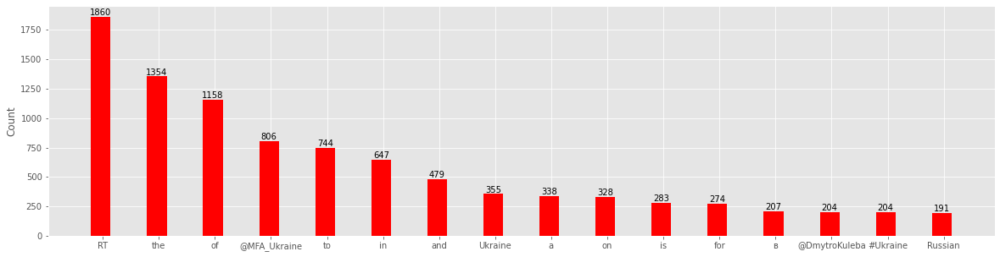

In [150]:
names, values = zip(*freq)
# names = [x[0] for x in data]  # These two lines are equivalent to the the zip-command.
# values = [x[1] for x in data] # These two lines are equivalent to the the zip-command.

ind = np.arange(len(freq))  # the x locations for the groups
width = 0.35       # the width of the bars

fig, ax = plt.subplots(figsize=(20,5))
rects1 = ax.bar(ind, values, width, color='r')
# add some text for labels, title and axes ticks
ax.set_ylabel('Count')
ax.set_xticks(ind+width/10.)
ax.set_xticklabels(names)

def autolabel(rects):
    # attach some text labels
    for rect in rects:
        height = rect.get_height()
        ax.text(rect.get_x() + rect.get_width()/2, height,
                '%d' % int(height),
                ha='center', va='bottom')

autolabel(rects1)

plt.show()

# vectorizing Ukr Embassy

In [151]:
from sklearn.feature_extraction.text import CountVectorizer
cv = CountVectorizer()

In [152]:
count_vector = cv.fit_transform(Ukr['text'])

In [153]:
count_vector.shape

(2780, 10078)

In [154]:
#cv.get_feature_names()

results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names()) 

results.head()

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,00,000,01,02,03,04,05,06,07,08,...,їдка,їжаках,їзд,їздили,їзду,їй,їх,їхньої,їхню,її
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [155]:
#cv.vocabulary_

In [156]:
cv = CountVectorizer(stop_words= nlp.Defaults.stop_words, min_df=0.01, max_df=0.95)

In [157]:
count_vector = cv.fit_transform(Ukr['text'])

In [158]:
results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names()) 

results.head()

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,2015,about,after,against,aggression,all,ambassador,amp,an,and,...,оон,посол,президент,про,рф,та,україна,україни,щодо,єс
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [159]:
from html import unescape
def my_tokenizer(doc):
            
    # apply the preprocessing and tokenzation steps
    doc_clean = unescape(doc).lower()
    tokens = nlp(doc_clean)
    lemmatized_tokens = [token.lemma_ for token in tokens if (len(str(token.lemma_))>2)]
            
    # use CountVectorizer's _word_ngrams built in method
    # to remove stop words and extract n-grams
    return(lemmatized_tokens)

In [160]:
cv = CountVectorizer(stop_words= nlp.Defaults.stop_words, min_df=0.01, max_df=0.95, tokenizer=my_tokenizer)
count_vector = cv.fit_transform(Ukr['text'])
results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names()) 
results.head()

/usr/local/lib/python3.7/dist-packages/sklearn/feature_extraction/text.py:401: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['έκασε ο', 'έτερα', 'έτερων', 'ήσω', 'ίσιος', 'αλλιώ', 'αλλιώτικος', 'αλλοιώ', 'αρκετός', 'γίνομαι', 'γρήγορο', 'διο', 'είχος', 'εαυτής', 'εαυτός', 'εκάστος', 'επόμενος', 'εσένος', 'ετέραις', 'ετού', 'ετούε ο', 'εχτής', 'ιδίο', 'κάνενς', 'κάνω', 'κανενό', 'λοιπός', 'μέλλω', 'μερικός', 'μπορώ', 'μόνας', 'ολωσδιόλος', 'ορισμένος', 'οριόμενσς', 'ποία', 'πολύς', 'προτός', 'προχτής', 'σε ο', 'ταύ', 'τουλάχισε ο', 'τρίτος', 'τός', 'χωριστό'] not in stop_words.
  % sorted(inconsistent)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,2015,@dmytrokuleba,@eminedzheppar,@greecemfa,@mfa_ukraine,@nikosdendias,@pavloklimkin,@poroshenko,@sergii_shutenko,@ukrinun,...,для,зустріч,мзс,оон,посол,президент,про,україна,україни,щодо
0,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [161]:
cv = CountVectorizer( stop_words= nlp.Defaults.stop_words, max_features=20) #, tokenizer=my_tokenizer)
count_vector = cv.fit_transform(Ukr['text'])
results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names()) 
results.head()

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,amp,and,by,dmytrokuleba,for,in,is,mfa_ukraine,of,on,rt,russia,russian,the,to,ukraine,ukrainian,we,with,україни
0,0,0,0,1,0,0,0,0,1,1,1,1,0,3,1,1,0,0,0,0
1,0,0,0,0,1,1,0,1,1,0,1,1,0,2,0,1,0,0,0,0
2,0,0,0,0,0,0,0,1,2,0,1,0,0,4,1,1,0,0,0,0
3,0,0,0,0,0,1,1,0,2,0,1,0,1,1,0,0,0,0,0,0
4,0,0,0,1,0,0,0,0,1,0,1,0,1,1,0,1,0,0,0,0


In [162]:
cv = CountVectorizer( stop_words= nlp.Defaults.stop_words, max_features=20, token_pattern = '\\ουκ[α-ωά-ώ]*\\b') #, tokenizer=my_tokenizer)
count_vector = cv.fit_transform(Ukr['text'])
results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names()) 
results.head()

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,ουκ,ουκραν,ουκρανία,ουκρανίας,ουκρανικά,ουκρανική,ουκρανικής,ουκρανικήςπρέσβειας,ουκρανικού,ουκρανικών,ουκρανοί,ουκρανού,ουκρανό,ουκρανώ
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [163]:
results.sum(axis =0).sort_values(ascending = False)

ουκρανίας              30
ουκρανία               15
ουκρανοί                5
ουκρανό                 4
ουκρανικού              2
ουκ                     1
ουκραν                  1
ουκρανικά               1
ουκρανική               1
ουκρανικής              1
ουκρανικήςπρέσβειας     1
ουκρανικών              1
ουκρανού                1
ουκρανώ                 1
dtype: int64

In [164]:
sum_words =  results.sum(axis =0)
sum_words.sort_values(ascending = False).head()   

ουκρανίας     30
ουκρανία      15
ουκρανοί       5
ουκρανό        4
ουκρανικού     2
dtype: int64

In [165]:
cv = CountVectorizer( stop_words= nlp.Defaults.stop_words, max_features=20, #ngram_range=(1, 2), 
 #                    token_pattern = '(\\bπ[οω]ρ[οω]ν[α-ωά-ώ]+\\b') )\| (\\bκυβ[α-ωά-ώ]\\b) #, tokenizer=my_tokenizer)
                     token_pattern = '\\bukraine[a-z0-9-_]*\\b') #, tokenizer=my_tokenizer)
count_vector = cv.fit_transform(Ukr['text'])
results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names()) 
results.head()

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,ukraine,ukraine-eu,ukraine-greece,ukraine-russia,ukraineallert,ukraineischanging,ukrainenewsalert,ukrainenotforgotten,ukrainereforms,ukraineremembers
0,1,0,0,0,0,0,0,0,0,0
1,1,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0


In [166]:
results.sum(axis =0).sort_values(ascending = False)

ukraine                666
ukrainenewsalert        14
ukrainereforms           5
ukraineischanging        3
ukraine-eu               2
ukraine-greece           1
ukraine-russia           1
ukraineallert            1
ukrainenotforgotten      1
ukraineremembers         1
dtype: int64

In [167]:
cv = CountVectorizer( stop_words= nlp.Defaults.stop_words, max_features=20, #ngram_range=(1, 2), 
                     vocabulary = ['Ukraine', 'Ουκρανία' , 'Ρωσια', 'Russia' , 'πολεμος']) #, tokenizer=my_tokenizer)
count_vector = cv.fit_transform(Ukr['text'])
results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names()) 
results.head()

/usr/local/lib/python3.7/dist-packages/sklearn/feature_extraction/text.py:1323: UserWarning: Upper case characters found in vocabulary while 'lowercase' is True. These entries will not be matched with any documents
  "Upper case characters found in"
/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,Ukraine,Ουκρανία,Ρωσια,Russia,πολεμος
0,0,0,0,0,0
1,0,0,0,0,0
2,0,0,0,0,0
3,0,0,0,0,0
4,0,0,0,0,0


In [168]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [169]:
tfidf_vectorizer = TfidfVectorizer(stop_words= nlp.Defaults.stop_words, max_features=500)
tfidf_matrix_train = tfidf_vectorizer.fit_transform(Ukr['text'])  #finds the tfidf score with normalization

In [170]:
results = pd.DataFrame(tfidf_matrix_train.toarray(), columns=tfidf_vectorizer.get_feature_names()) 
results.head()

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,00,10,100,11,12,13,15,16,17,18,...,шкуров,що,щодо,язку,як,які,яті,єс,із,інтерв
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [171]:
from sklearn.metrics.pairwise import cosine_similarity

print("cosine scores ==> ",cosine_similarity(tfidf_matrix_train[0:1], tfidf_matrix_train))  #here the first element of tfidf_matrix_train is matched with other three elements


cosine scores ==>  [[1.         0.27549568 0.19396436 ... 0.14845788 0.06560451 0.1266539 ]]


In [172]:
print("cosine scores ==> ",cosine_similarity(tfidf_matrix_train, tfidf_matrix_train))  #here the first element of tfidf_matrix_train is matched with other three elements


cosine scores ==>  [[1.         0.27549568 0.19396436 ... 0.14845788 0.06560451 0.1266539 ]
 [0.27549568 1.         0.21835267 ... 0.12168159 0.09775251 0.12454543]
 [0.19396436 0.21835267 1.         ... 0.15094435 0.07594438 0.04384909]
 ...
 [0.14845788 0.12168159 0.15094435 ... 1.         0.10554021 0.13446766]
 [0.06560451 0.09775251 0.07594438 ... 0.10554021 1.         0.13682732]
 [0.1266539  0.12454543 0.04384909 ... 0.13446766 0.13682732 1.        ]]


In [173]:
arr = cosine_similarity(tfidf_matrix_train, tfidf_matrix_train)

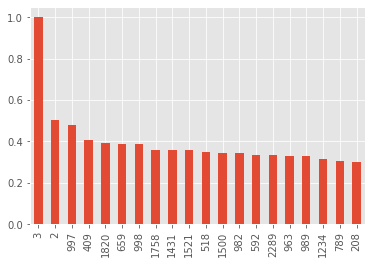

In [174]:
pd.DataFrame(arr).loc[3].sort_values(ascending = False).head(20).plot(kind = 'bar')

In [175]:
Ukr['text'].loc[3]

'RT @OlegNikolenko_: Syria’s recognition of the so-called independence of Russian-occupied territories in Donbas is an unfriendly act toward…'

In [176]:
Ukr['text'].loc[2523]

"Виконання військового обов'язку гр.України в особливий період: "

# Emolex Ukr Embassy

In [177]:
filepath = "https://raw.githubusercontent.com/datajour-gr/Data_journalism/master/week10/NRC_GREEK_Translated_6_2020.csv"
emolex_df = pd.read_csv(filepath)
emolex_df.head()

,word,Positive,Negative,Anger,Anticipation,Disgust,Fear,Joy,Sadness,Surprise,Trust
0,αφεση,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,ενορκη βεβαιωση,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,εχοντας,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,εχω,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,οριο,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [178]:
emolex_df.tail()

,word,Positive,Negative,Anger,Anticipation,Disgust,Fear,Joy,Sadness,Surprise,Trust
13166,ουρλιασμα,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
13167,κροκος αυγου,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13168,νεοτερος,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13169,ζεφυρος,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13170,ζουμ,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [179]:
emolex_df = emolex_df.drop_duplicates(subset=['word'])
emolex_df = emolex_df.dropna()
emolex_df.reset_index(drop = True, inplace = True)

In [180]:
emolex_df.tail()

,word,Positive,Negative,Anger,Anticipation,Disgust,Fear,Joy,Sadness,Surprise,Trust
13156,ουρλιασμα,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
13157,κροκος αυγου,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13158,νεοτερος,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13159,ζεφυρος,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13160,ζουμ,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [181]:
import spacy
nlp = spacy.load('el_core_news_sm')

In [182]:
#Ukr_tweets_df = pd.read_csv("/content/gdrive/MyDrive/Colab Notebooks/Ukr_twitter.tsv", sep='\t')

In [183]:
len(Ukr)

2780

In [184]:
#short_tweets_Ukr = Ukr[['created_at','full_text' ]]
#short_tweets_Ukr = short_tweets_Ukr.rename(columns={'created_at': 'date', 'full_text': 'text'} )

In [185]:
short_tweets_Ukr = Ukr[['date','text' ]]

short_tweets_Ukr

,date,text
0,Fri Jul 01 04:52:21 +0000 2022,RT @DmytroKuleba: Russia’s use of the Caspian ...
1,Fri Jul 01 04:52:12 +0000 2022,"RT @MFA_Ukraine: For the last week, #Russia in..."
2,Fri Jul 01 04:51:49 +0000 2022,RT @MFA_Ukraine: #Ukraine strongly condemns th...
3,Fri Jul 01 04:51:39 +0000 2022,RT @OlegNikolenko_: Syria’s recognition of the...
4,Fri Jul 01 04:51:33 +0000 2022,RT @DmytroKuleba: After Ukraine has defeated R...
...,...,...
2775,Wed Jun 25 06:33:52 +0000 2014,RT @PavloKlimkin: Вперше Україна була запрошен...
2776,Wed Jun 18 09:07:21 +0000 2014,RT @MFA_Ukraine: Сьогодні в ООН заслухають доп...
2777,Wed Jun 18 09:06:30 +0000 2014,RT @ADeshchytsia: Talked to FM @WilliamJHague ...
2778,Wed Jun 18 08:20:09 +0000 2014,RT @ADeshchytsia: Приношу соболезнования родны...


In [186]:
short_tweets_Ukr.tail()

,date,text
2775,Wed Jun 25 06:33:52 +0000 2014,RT @PavloKlimkin: Вперше Україна була запрошен...
2776,Wed Jun 18 09:07:21 +0000 2014,RT @MFA_Ukraine: Сьогодні в ООН заслухають доп...
2777,Wed Jun 18 09:06:30 +0000 2014,RT @ADeshchytsia: Talked to FM @WilliamJHague ...
2778,Wed Jun 18 08:20:09 +0000 2014,RT @ADeshchytsia: Приношу соболезнования родны...
2779,Thu Jun 05 08:33:42 +0000 2014,RT @euronews: [HAPPENING NOW] Petro #Poroshenk...


In [187]:
short_tweets_Ukr.dtypes

date    object
text    object
dtype: object

In [188]:
short_tweets_Ukr['date'] = pd.to_datetime(short_tweets_Ukr['date'], format='%a %b %d %H:%M:%S +0000 %Y')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [189]:
short_tweets_Ukr['year'] = pd.DatetimeIndex(short_tweets_Ukr['date']).year
short_tweets_Ukr['month'] = pd.DatetimeIndex(short_tweets_Ukr['date']).month
short_tweets_Ukr['day'] = pd.DatetimeIndex(short_tweets_Ukr['date']).day
short_tweets_Ukr

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documen

,date,text,year,month,day
0,2022-07-01 04:52:21,RT @DmytroKuleba: Russia’s use of the Caspian ...,2022,7,1
1,2022-07-01 04:52:12,"RT @MFA_Ukraine: For the last week, #Russia in...",2022,7,1
2,2022-07-01 04:51:49,RT @MFA_Ukraine: #Ukraine strongly condemns th...,2022,7,1
3,2022-07-01 04:51:39,RT @OlegNikolenko_: Syria’s recognition of the...,2022,7,1
4,2022-07-01 04:51:33,RT @DmytroKuleba: After Ukraine has defeated R...,2022,7,1
...,...,...,...,...,...
2775,2014-06-25 06:33:52,RT @PavloKlimkin: Вперше Україна була запрошен...,2014,6,25
2776,2014-06-18 09:07:21,RT @MFA_Ukraine: Сьогодні в ООН заслухають доп...,2014,6,18
2777,2014-06-18 09:06:30,RT @ADeshchytsia: Talked to FM @WilliamJHague ...,2014,6,18
2778,2014-06-18 08:20:09,RT @ADeshchytsia: Приношу соболезнования родны...,2014,6,18


In [190]:
short_tweets_Ukr.dtypes

date     datetime64[ns]
text             object
year              int64
month             int64
day               int64
dtype: object

In [191]:
emolex_df['word'].head(3)

0              αφεση
1    ενορκη βεβαιωση
2            εχοντας
Name: word, dtype: object

In [192]:
short_tweets_Ukr['text'] = short_tweets_Ukr['text'].str.replace(r'https?:\/\/.*[\r\n]*'," ")

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning: The default value of regex will change from True to False in a future version.
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [193]:
short_tweets_Ukr.head()

,date,text,year,month,day
0,2022-07-01 04:52:21,RT @DmytroKuleba: Russia’s use of the Caspian ...,2022,7,1
1,2022-07-01 04:52:12,"RT @MFA_Ukraine: For the last week, #Russia in...",2022,7,1
2,2022-07-01 04:51:49,RT @MFA_Ukraine: #Ukraine strongly condemns th...,2022,7,1
3,2022-07-01 04:51:39,RT @OlegNikolenko_: Syria’s recognition of the...,2022,7,1
4,2022-07-01 04:51:33,RT @DmytroKuleba: After Ukraine has defeated R...,2022,7,1


In [194]:
vec = CountVectorizer(analyzer = 'word', vocabulary = emolex_df.word, 
                      strip_accents = 'unicode',  
                      stop_words= nlp.Defaults.stop_words,
                      ngram_range=(1, 2))

In [195]:
#from sklearn.feature_extraction.text import TfidfVectorizer
#CountVectorizer(stop_words='english', binary=True)
# Θέλω να ελέγξω μόνο τις λέξεις που υπάρχουν στο συναισθηματικό λεξικό

#CountVectorizer(analyzer = 'word', 
#              strip_accents = 'unicode', 
#               token_pattern='[Α-Ωα-ωΆ-Ώά-ώ]{2,}', 
#               stop_words= lc_stop_words_df['stop_w'].tolist())


matrix = vec.fit_transform(short_tweets_Ukr['text'])
vocab = vec.get_feature_names()
wordcount_df = pd.DataFrame(matrix.toarray(), columns=vocab)
wordcount_df.head()

/usr/local/lib/python3.7/dist-packages/sklearn/feature_extraction/text.py:1323: UserWarning: Upper case characters found in vocabulary while 'lowercase' is True. These entries will not be matched with any documents
  "Upper case characters found in"
/usr/local/lib/python3.7/dist-packages/sklearn/feature_extraction/text.py:401: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['αδιακοπα', 'ακομα', 'ακομη', 'ακριβως', 'αλλα', 'αλλαχου', 'αλλες', 'αλλη', 'αλλην', 'αλλης', 'αλλιως', 'αλλιωτικα', 'αλλο', 'αλλοι', 'αλλοιως', 'αλλοιωτικα', 'αλλον', 'αλλος', 'αλλοτε', 'αλλου', 'αλλους', 'αλλων', 'αμα', 'αμεσα', 'αμεσως', 'ανα', 'αναμεσα', 'αναμεταξυ', 'ανευ', 'αντι', 'αντιπερα', 'αντις', 'ανω', 'ανωτερω', 'αξαφνα', 'απεναντι', 'απο', 'αποψε', 'αρα', 'αραγε', 'αρκετα', 'αρκετες', 'αρχικα', 'αυριο', 'αυτα', 'αυτες', 'αυτη', 'αυτην', 'αυτης', 'αυτο', 'αυτοι', 'αυτον', 'αυτος', 'αυτου', 'αυτους', 'αυτων', 'αφοτου', 'αφου', 'βεβαια

,αφεση,ενορκη βεβαιωση,εχοντας,εχω,οριο,ορμος,υδρα,αγια τραπεζα,αμην,απατσι,...,κλητηριο ενταλμα,κατειργασμενος,μαγια,κιτρινο,κιτρινιζω,ουρλιασμα,κροκος αυγου,νεοτερος,ζεφυρος,ζουμ
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [196]:
wordcount_df.shape

(2780, 13161)

In [197]:
emolex_df.head()

,word,Positive,Negative,Anger,Anticipation,Disgust,Fear,Joy,Sadness,Surprise,Trust
0,αφεση,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,ενορκη βεβαιωση,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,εχοντας,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,εχω,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,οριο,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [198]:
emolex_df[emolex_df.Anger == 1].tail()

,word,Positive,Negative,Anger,Anticipation,Disgust,Fear,Joy,Sadness,Surprise,Trust
13094,διεξοδος,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13096,ζωυφια,0.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0
13100,θυματοποιω,0.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0
13128,αποτυχημενος,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
13156,ουρλιασμα,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0


In [199]:
# Φτιάξε μια λίστα με positive words

angry_words = emolex_df[emolex_df.Anger == 1]['word']

positive_words = emolex_df[emolex_df.Positive == 1]['word']


# Φτιάξε μια λίστα με sadness words
sadness_words = emolex_df[emolex_df.Sadness == 1]['word']


# Φτιάξε μια λίστα με surprise words
surprise_words = emolex_df[emolex_df.Surprise == 1]['word']


# Φτιάξε μια λίστα με disgust words
disgust_words = emolex_df[emolex_df.Disgust == 1]['word']


# Φτιάξε μια λίστα με anticipation words
anticipation_words = emolex_df[emolex_df.Anticipation == 1]['word']


# Φτιάξε μια λίστα με negative words
negative_words = emolex_df[emolex_df.Negative == 1]['word']



# Φτιάξε μια λίστα με joy words
joy_words = emolex_df[emolex_df.Joy == 1]['word']


# Φτιάξε μια λίστα με trust words
trust_words = emolex_df[emolex_df.Trust == 1]['word']



# Φτιάξε μια λίστα με fear words
fear_words = emolex_df[emolex_df.Fear == 1]['word']


In [200]:
short_tweets_Ukr.head(3)

,date,text,year,month,day
0,2022-07-01 04:52:21,RT @DmytroKuleba: Russia’s use of the Caspian ...,2022,7,1
1,2022-07-01 04:52:12,"RT @MFA_Ukraine: For the last week, #Russia in...",2022,7,1
2,2022-07-01 04:51:49,RT @MFA_Ukraine: #Ukraine strongly condemns th...,2022,7,1


In [201]:
short_tweets_Ukr['anger'] = wordcount_df[angry_words].sum(axis=1)

short_tweets_Ukr['positivity'] = wordcount_df[positive_words].sum(axis=1)


short_tweets_Ukr['joy'] = wordcount_df[joy_words].sum(axis=1)


short_tweets_Ukr['disgust'] = wordcount_df[disgust_words].sum(axis=1)


short_tweets_Ukr['surprise'] = wordcount_df[surprise_words].sum(axis=1)

short_tweets_Ukr['trust'] = wordcount_df[trust_words].sum(axis=1)


short_tweets_Ukr['anticipation'] = wordcount_df[anticipation_words].sum(axis=1)


short_tweets_Ukr['sadness'] = wordcount_df[sadness_words].sum(axis=1)

short_tweets_Ukr['negative'] = wordcount_df[negative_words].sum(axis=1)

short_tweets_Ukr['fear'] = wordcount_df[fear_words].sum(axis=1)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [202]:
short_tweets_Ukr

,date,text,year,month,day,anger,positivity,joy,disgust,surprise,trust,anticipation,sadness,negative,fear
0,2022-07-01 04:52:21,RT @DmytroKuleba: Russia’s use of the Caspian ...,2022,7,1,0,0,0,0,0,0,0,0,0,0
1,2022-07-01 04:52:12,"RT @MFA_Ukraine: For the last week, #Russia in...",2022,7,1,0,0,0,0,0,0,0,0,0,0
2,2022-07-01 04:51:49,RT @MFA_Ukraine: #Ukraine strongly condemns th...,2022,7,1,0,0,0,0,0,0,0,0,0,0
3,2022-07-01 04:51:39,RT @OlegNikolenko_: Syria’s recognition of the...,2022,7,1,0,0,0,0,0,0,0,0,0,0
4,2022-07-01 04:51:33,RT @DmytroKuleba: After Ukraine has defeated R...,2022,7,1,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2775,2014-06-25 06:33:52,RT @PavloKlimkin: Вперше Україна була запрошен...,2014,6,25,0,0,0,0,0,0,0,0,0,0
2776,2014-06-18 09:07:21,RT @MFA_Ukraine: Сьогодні в ООН заслухають доп...,2014,6,18,0,0,0,0,0,0,0,0,0,0
2777,2014-06-18 09:06:30,RT @ADeshchytsia: Talked to FM @WilliamJHague ...,2014,6,18,0,0,0,0,0,0,0,0,0,0
2778,2014-06-18 08:20:09,RT @ADeshchytsia: Приношу соболезнования родны...,2014,6,18,0,0,0,0,0,0,0,0,0,0


In [203]:
max = 0
happiest_tweet = ""
for i in range(0,len(short_tweets_Ukr)):
  #print(short_tweets_Rus.iloc[i]['positivity'])
  if short_tweets_Ukr.iloc[i]['positivity'] > max:
    happiest_tweet = short_tweets_Ukr.iloc[i]['text']
    max = short_tweets_Ukr.iloc[i]['positivity']


happiest_tweet

'Σύμμαχοι από όλο τον κόσμο, σας ευχαριστούμε θερμά για την αλληλεγγύη σας κατά τη διάρκεια των 100 ημερών της ηρωικής αντίστασης της 🇺🇦 ενάντια στον πόλεμο πλήρους κλίμακας της Ρωσίας.\nΓια την πίστη σας στη νίκη της 🇺🇦.\nΓια όλη τη βοήθειά σας.\n\nΕυχαριστούμε! \n\nVideo: banda  '

In [204]:
max = 0
negative_tweet = ""
for i in range(0,len(short_tweets_Ukr)):
  #print(short_tweets_Ukr.iloc[i]['positivity'])
  if short_tweets_Ukr.iloc[i]['negative'] > max:
    negative_tweet = short_tweets_Ukr.iloc[i]['text']
    max = short_tweets_Ukr.iloc[i]['negative']


negative_tweet

'RT @PresidencyGR: Η 🇷🇺 πρέπει να σεβαστεί την εδαφική ακεραιότητα και κυριαρχία της 🇺🇦 και να αποσύρει έστω και τώρα τον στρατό της. Είμαι…'

In [205]:
max = 0
saddest_tweet = ""
for i in range(0,len(short_tweets_Ukr)):
  #print(short_tweets_Ukr.iloc[i]['positivity'])
  if short_tweets_Ukr.iloc[i]['sadness'] > max:
    saddest_tweet = short_tweets_Ukr.iloc[i]['text']
    max = short_tweets_Ukr.iloc[i]['sadness']

saddest_tweet

'.@DmytroKuleba : Επιτρέψτε μου να το δηλώσω επίσημα: Η Ουκρανία δεν σχεδιάζει στρατιωτική επίθεση στο Ντονμπάς. Είμαστε αφοσιωμένοι στην αναζήτηση πολιτικών και διπλωματικών λύσεων για την σύγκρουση 2/4'

In [206]:
max = 0
fear_tweet = ""
for i in range(0,len(short_tweets_Ukr)):
  #print(short_tweets_Ukr.iloc[i]['positivity'])
  if short_tweets_Ukr.iloc[i]['fear'] > max:
    fear_tweet = short_tweets_Ukr.iloc[i]['text']
    max = short_tweets_Ukr.iloc[i]['fear']

fear_tweet

'🇺🇦 στρατός συνεχίζει να μάχεται στην πολιορκημένη #Mariupol, που έχει καταστραφεί από τους σφοδρούς βομβαρδισμούς 🇷🇺.  Η κατάσταση στο Azovstal είναι απελπιστική.  '

In [207]:
max = 0
trust_tweet = ""
for i in range(0,len(short_tweets_Ukr)):
  #print(short_tweets_Ukr.iloc[i]['positivity'])
  if short_tweets_Ukr.iloc[i]['trust'] > max:
    trust_tweet = short_tweets_Ukr.iloc[i]['text']
    max = short_tweets_Ukr.iloc[i]['trust']

trust_tweet

'Εκατοντάδες πολίτες, παιδιά, τραυματίσμενοι Ουκρανοί υπερασπιστές έχουν παγιδευτεί σε καταφύγιο του εργοστασίου.  Δεν έχουν σχεδόν καθόλου τροφή, νερό, απαραίτητα φάρμακα\nΤο #Azovstal βομβαρδίζεται συνεχώς από τη 🇷🇺, παρά τον μεγάλο αριθμό αμάχων που έχουν βρει  εκεί το καταφύγιο'

In [208]:
short_tweets_Ukr.set_index('date' , inplace=True)

In [209]:
import matplotlib.pyplot as plt
plt.style.use('ggplot')

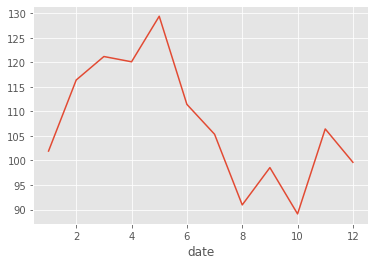

In [210]:
short_tweets_Ukr['text'].str.len().groupby(by=short_tweets_Ukr.index.month).mean().plot()

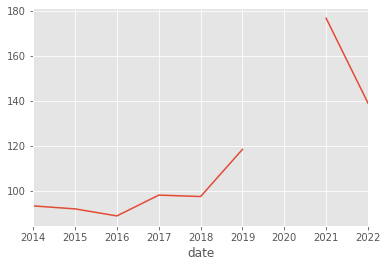

In [211]:
short_tweets_Ukr['text'].str.len().resample('A').mean().plot() 

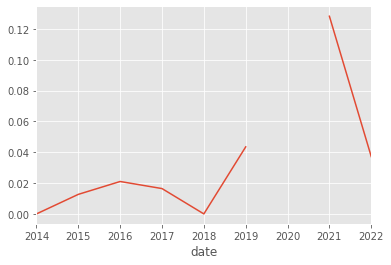

In [212]:
short_tweets_Ukr['positivity'].resample('A').mean().plot() 

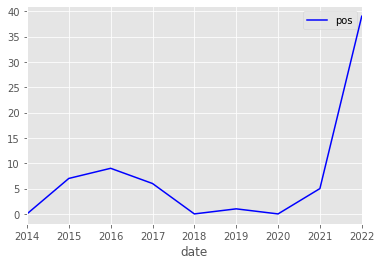

In [213]:
short_tweets_Ukr['positivity'].resample('A').sum().plot(color = 'b',label = 'pos').legend() 

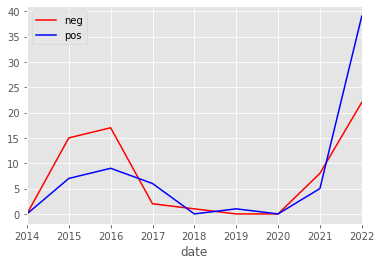

In [214]:
short_tweets_Ukr['negative'].resample('A').sum().plot(color = 'r',label = 'neg').legend() 
short_tweets_Ukr['positivity'].resample('A').sum().plot(color = 'b',label = 'pos').legend() 

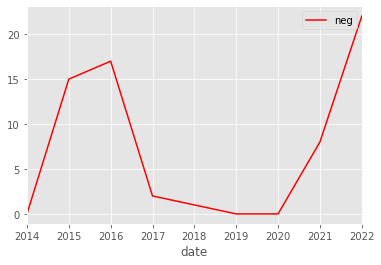

In [215]:
short_tweets_Ukr['negative'].resample('A').sum().plot(color = 'r',label = 'neg').legend() 

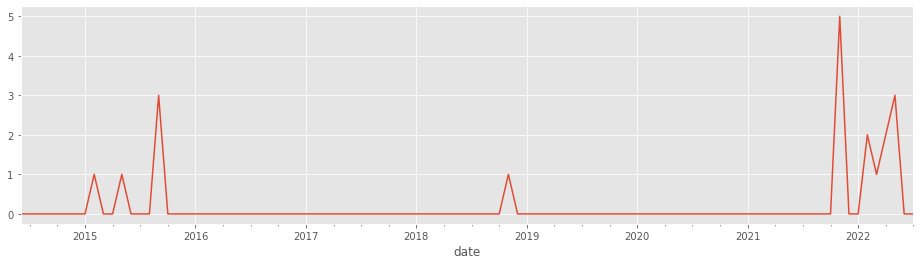

In [216]:
short_tweets_Ukr['anger'].resample('M').sum().plot(figsize=(16,4))

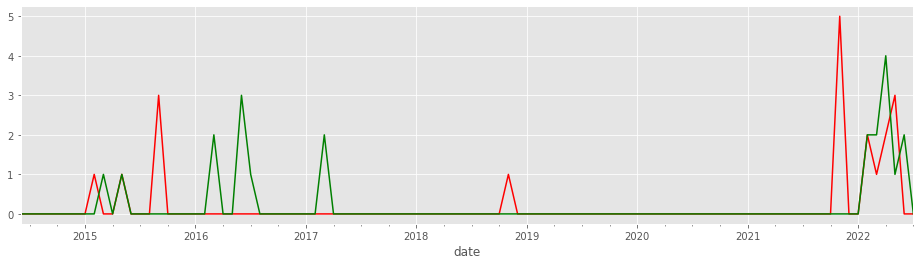

In [217]:
ax = short_tweets_Ukr['anger'].resample('M').sum().plot(figsize=(16,4), color = 'red')
short_tweets_Ukr['joy'].resample('M').sum().plot(figsize=(16,4), ax = ax, color = 'green')

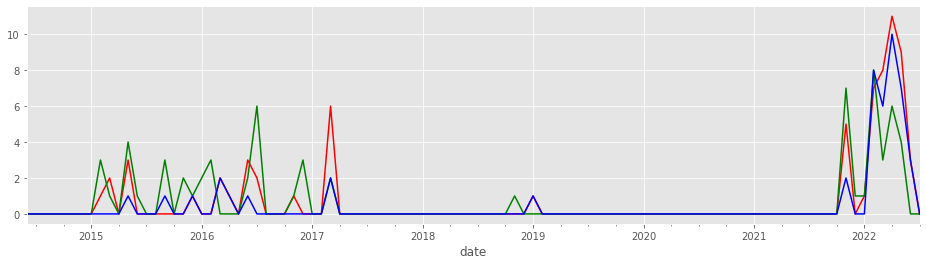

In [218]:
ax = short_tweets_Ukr['positivity'].resample('M').sum().plot(figsize=(16,4), color = 'red')
short_tweets_Ukr['negative'].resample('M').sum().plot(figsize=(16,4), ax = ax, color = 'green')
short_tweets_Ukr['trust'].resample('M').sum().plot(figsize=(16,4), ax = ax, color = 'blue')

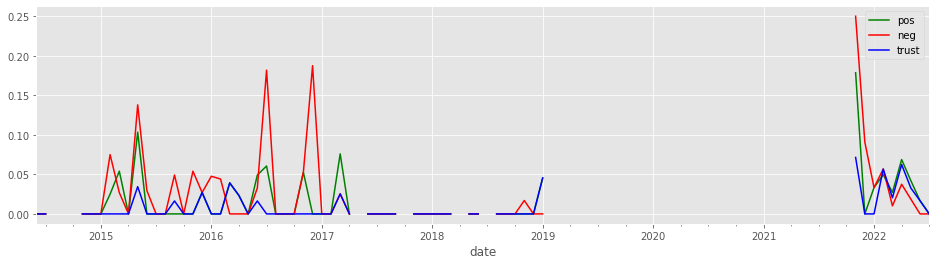

In [219]:
ax = short_tweets_Ukr['positivity'].resample('M').mean().plot(figsize=(16,4), 
                                                          color = 'g', label='pos')
short_tweets_Ukr['negative'].resample('M').mean().plot(figsize=(16,4), ax = ax, 
                                                   label = 'neg', color = 'r')
short_tweets_Ukr['trust'].resample('M').mean().plot(figsize=(16,4), ax = ax, 
                                                label = 'trust',color = 'blue').legend()

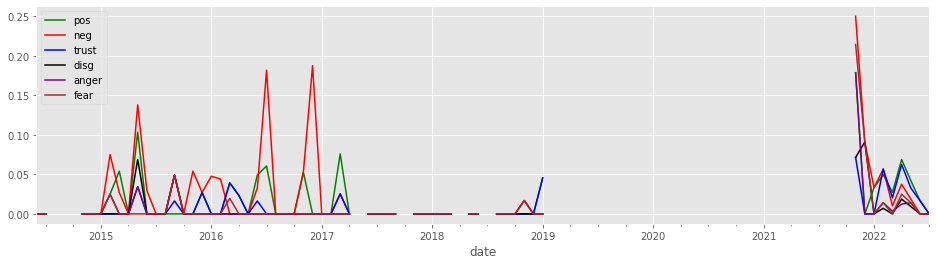

In [220]:
plt.style.use('ggplot')
ax = short_tweets_Ukr['positivity'].resample('M').mean().plot(figsize=(16,4), 
                                                          color = 'g', label='pos')
short_tweets_Ukr['negative'].resample('M').mean().plot(figsize=(16,4), ax = ax, 
                                                   label = 'neg', color = 'r')
short_tweets_Ukr['trust'].resample('M').mean().plot(figsize=(16,4), ax = ax, 
                                                label = 'trust',color = 'blue').legend()

short_tweets_Ukr['disgust'].resample('M').mean().plot(figsize=(16,4), ax = ax, 
                                                label = 'disg',color = 'black').legend() 

short_tweets_Ukr['anger'].resample('M').mean().plot(figsize=(16,4), ax = ax, 
                                                label = 'anger',color = 'purple').legend() 

short_tweets_Ukr['fear'].resample('M').mean().plot(figsize=(16,4), ax = ax, 
                                                label = 'fear',color = 'brown').legend()    

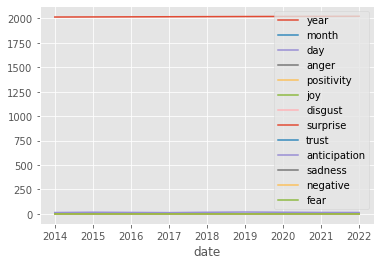

In [221]:
short_tweets_Ukr.groupby(by=short_tweets_Ukr.index.year).mean().plot()

Text(0, 0.5, 'Years')

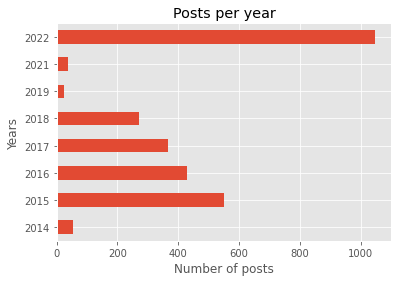

In [222]:
short_tweets_Ukr['text'].groupby(by=short_tweets_Ukr.index.year).count().plot(kind='barh')
plt.title("Posts per year")
plt.xlabel("Number of posts")
plt.ylabel("Years")

Text(0, 0.5, 'Month of the year')

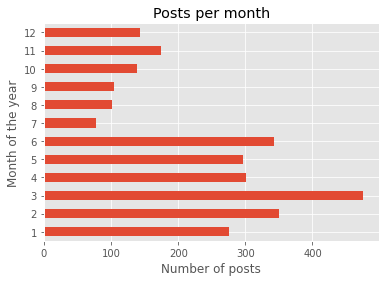

In [223]:
short_tweets_Ukr['text'].groupby(by=short_tweets_Ukr.index.month).count().plot(kind='barh')
plt.title("Posts per month")
plt.xlabel("Number of posts")
plt.ylabel("Month of the year")

Text(0, 0.5, 'Hour of the day')

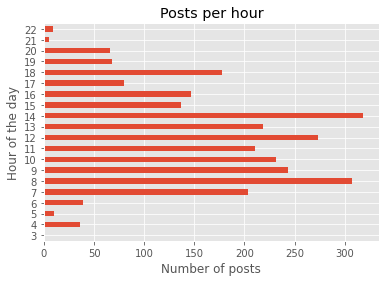

In [224]:
short_tweets_Ukr['text'].groupby(by=short_tweets_Ukr.index.hour).count().plot(kind='barh')
plt.title("Posts per hour")
plt.xlabel("Number of posts")
plt.ylabel("Hour of the day")

# Ru - Ukr

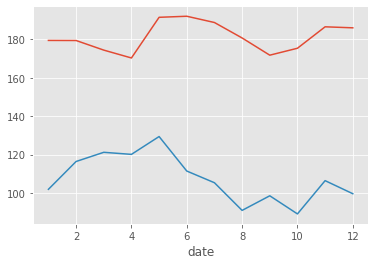

In [225]:
short_tweets_Rus['text'].str.len().groupby(by=short_tweets_Rus.index.month).mean().plot()
short_tweets_Ukr['text'].str.len().groupby(by=short_tweets_Ukr.index.month).mean().plot()

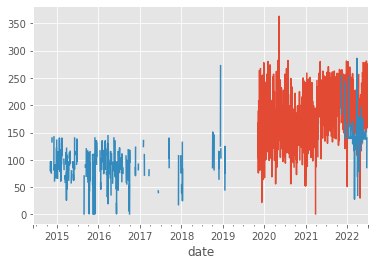

In [226]:
short_tweets_Rus['text'].str.len().resample('D').mean().plot() 
short_tweets_Ukr['text'].str.len().resample('D').mean().plot() 

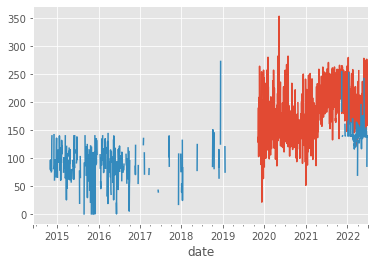

In [227]:
short_tweets_Rus['text'].str.len().resample('B').mean().plot() 
short_tweets_Ukr['text'].str.len().resample('B').mean().plot() 

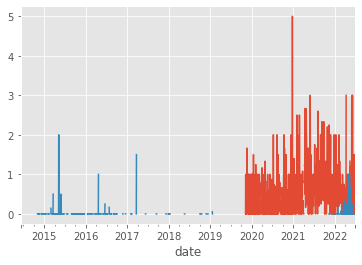

In [228]:
short_tweets_Rus['positivity'].resample('B').mean().plot() 
short_tweets_Ukr['positivity'].resample('B').mean().plot() 

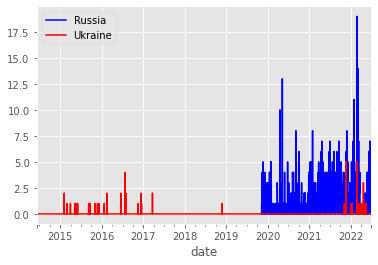

In [229]:
short_tweets_Rus['negative'].resample('B').sum().plot(color = 'b',label = 'Russia').legend() 
short_tweets_Ukr['negative'].resample('B').sum().plot(color = 'r',label = 'Ukraine').legend() 

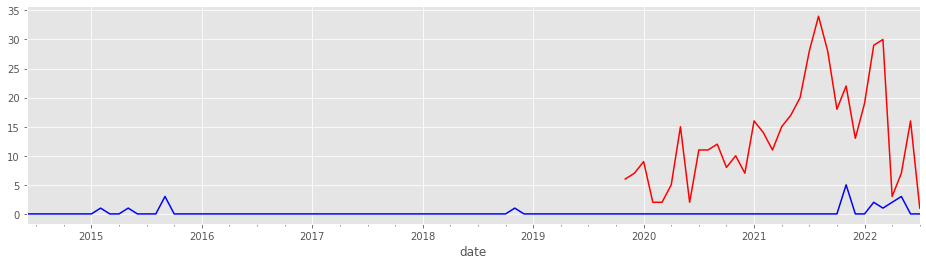

In [230]:
short_tweets_Rus['anger'].resample('M').sum().plot(figsize=(16,4), color = 'red')
short_tweets_Ukr['anger'].resample('M').sum().plot(figsize=(16,4), color = 'blue')

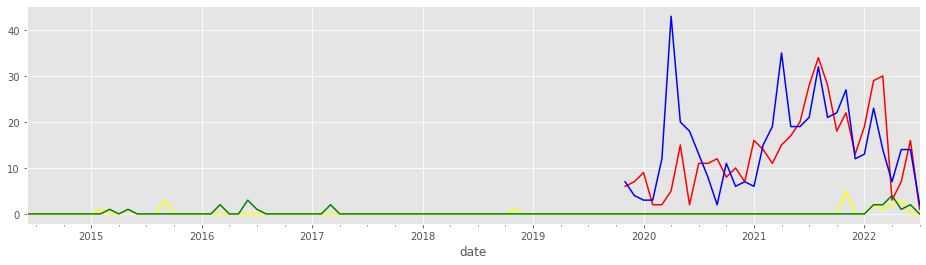

In [231]:
ax = short_tweets_Rus['anger'].resample('M').sum().plot(figsize=(16,4), color = 'red')
short_tweets_Rus['joy'].resample('M').sum().plot(figsize=(16,4), ax = ax, color = 'blue')
ax = short_tweets_Ukr['anger'].resample('M').sum().plot(figsize=(16,4), color = 'yellow')
short_tweets_Ukr['joy'].resample('M').sum().plot(figsize=(16,4), ax = ax, color = 'green')

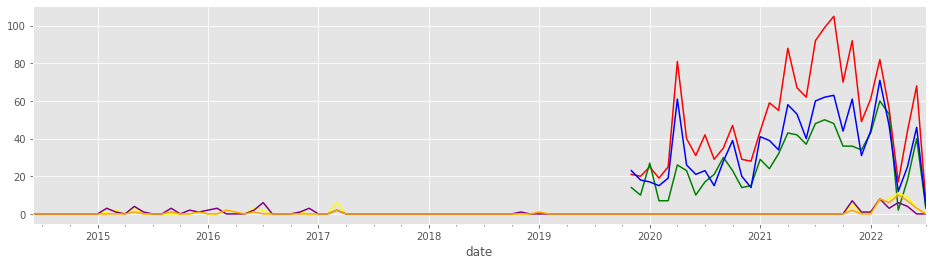

In [232]:
ax = short_tweets_Rus['positivity'].resample('M').sum().plot(figsize=(16,4), color = 'red')
short_tweets_Rus['negative'].resample('M').sum().plot(figsize=(16,4), ax = ax, color = 'green')
short_tweets_Rus['trust'].resample('M').sum().plot(figsize=(16,4), ax = ax, color = 'blue')
ax = short_tweets_Ukr['positivity'].resample('M').sum().plot(figsize=(16,4), color = 'yellow')
short_tweets_Ukr['negative'].resample('M').sum().plot(figsize=(16,4), ax = ax, color = 'purple')
short_tweets_Ukr['trust'].resample('M').sum().plot(figsize=(16,4), ax = ax, color = 'orange')

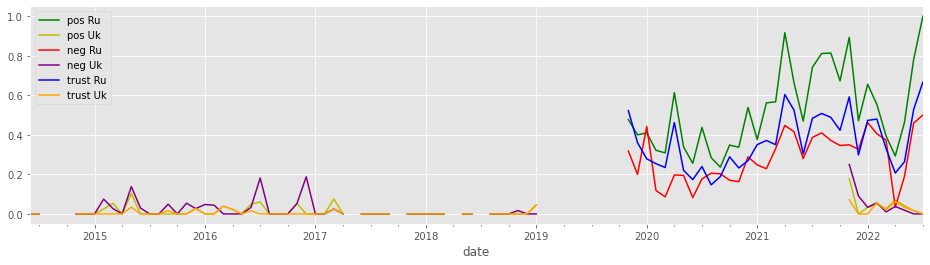

In [233]:
ax = short_tweets_Rus['positivity'].resample('M').mean().plot(figsize=(16,4), 
                                                          color = 'g', label='pos Ru')
ax = short_tweets_Ukr['positivity'].resample('M').mean().plot(figsize=(16,4), 
                                                          color = 'y', label='pos Uk')
short_tweets_Rus['negative'].resample('M').mean().plot(figsize=(16,4), ax = ax, 
                                                   label = 'neg Ru', color = 'r')
short_tweets_Ukr['negative'].resample('M').mean().plot(figsize=(16,4), ax = ax, 
                                                   label = 'neg Uk', color = 'purple')
short_tweets_Rus['trust'].resample('M').mean().plot(figsize=(16,4), ax = ax, 
                                                label = 'trust Ru',color = 'blue').legend()
short_tweets_Ukr['trust'].resample('M').mean().plot(figsize=(16,4), ax = ax, 
                                                label = 'trust Uk',color = 'orange').legend()

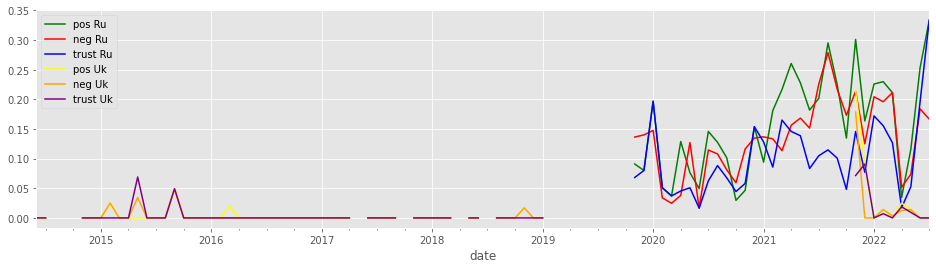

In [234]:
plt.style.use('ggplot')
ax = short_tweets_Rus['fear'].resample('M').mean().plot(figsize=(16,4), 
                                                          color = 'g', label='pos Ru')
short_tweets_Rus['anger'].resample('M').mean().plot(figsize=(16,4), ax = ax, 
                                                   label = 'neg Ru', color = 'r')
short_tweets_Rus['disgust'].resample('M').mean().plot(figsize=(16,4), ax = ax, 
                                                label = 'trust Ru',color = 'blue').legend()    
short_tweets_Ukr['fear'].resample('M').mean().plot(figsize=(16,4), 
                                                          color = 'yellow', label='pos Uk')
short_tweets_Ukr['anger'].resample('M').mean().plot(figsize=(16,4), ax = ax, 
                                                   label = 'neg Uk', color = 'orange')
short_tweets_Ukr['disgust'].resample('M').mean().plot(figsize=(16,4), ax = ax, 
                                                label = 'trust Uk',color = 'purple').legend()                                                